<a href="https://colab.research.google.com/github/sourishdey2005/Uber_RIde_Analysis/blob/main/uber_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/uber-ride-analytics-dashboard/ncr_ride_bookings.csv
/kaggle/input/uber-ride-analytics-dashboard/Dasboard.gif
/kaggle/input/uber-ride-analytics-dashboard/Uber.pbix


In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("yashdevladdha/uber-ride-analytics-dashboard")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/uber-ride-analytics-dashboard


In [ ]:
#importing necessary package
!pip install pandas numpy matplotlib seaborn plotly folium scikit-learn statsmodels missingno squarify wordcloud

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import folium
from folium.plugins import HeatMap
import missingno as msno
import squarify
from wordcloud import WordCloud
from datetime import datetime, timedelta
import warnings
warnings.filterwarnings('ignore')

# Setting  up plotting style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

In [ ]:
import numpy as np
import pandas as pd

def create_sample_uber_data():
    np.random.seed(42)
    n_records = 148770

    # Dates for 2024
    dates = pd.date_range('2024-01-01', '2024-12-31', freq='D')

    # Vehicle types and normalized probabilities
    vehicle_types = ['Auto', 'eBike/Bike', 'Go Mini', 'Go Sedan', 'Premier Sedan', 'UberXL']
    raw_vehicle_probs = np.array([0.216, 0.192, 0.174, 0.157, 0.105, 0.026])
    vehicle_probs = raw_vehicle_probs / raw_vehicle_probs.sum()

    # Booking statuses and probabilities
    statuses = ['Completed', 'Cancelled by Customer', 'Cancelled by Driver', 'Incomplete']
    status_probs = [0.91, 0.05, 0.03, 0.01]

    # Create sample data
    data = {
        'Date': np.random.choice(dates, n_records),
        'Time': [f"{np.random.randint(0,24):02d}:{np.random.randint(0,60):02d}" for _ in range(n_records)],
        'Booking ID': [f'UBER{str(i).zfill(8)}' for i in range(n_records)],
        'Booking Status': np.random.choice(statuses, n_records, p=status_probs),
        'Customer ID': [f'CUST{np.random.randint(100000,999999)}' for _ in range(n_records)],
        'Vehicle Type': np.random.choice(vehicle_types, n_records, p=vehicle_probs),
        'Pickup Location': [f"Location_{np.random.randint(1,100)}" for _ in range(n_records)],
        'Drop Location': [f"Location_{np.random.randint(1,100)}" for _ in range(n_records)],
        'Avg VTAT': np.random.normal(8, 3, n_records).clip(2, 20),
        'Avg CTAT': np.random.normal(25, 10, n_records).clip(5, 60),
        'Cancelled Rides by Customer': np.random.choice([0, 1], n_records, p=[0.95, 0.05]),
        'Reason for cancelling by Customer': np.random.choice(
            ['Driver late', 'Change of plans', 'Found alternative', 'Price issue', 'Other'], n_records),
        'Cancelled Rides by Driver': np.random.choice([0, 1], n_records, p=[0.97, 0.03]),
        'Driver Cancellation Reason': np.random.choice(
            ['Customer not ready', 'Vehicle issue', 'Traffic', 'Personal reason', 'Other'], n_records),
        'Incomplete Rides': np.random.choice([0, 1], n_records, p=[0.99, 0.01]),
        'Incomplete Rides Reason': np.random.choice(
            ['Technical issue', 'Payment failure', 'Customer request', 'Safety concern'], n_records),
        'Booking Value': np.random.lognormal(3.5, 0.8, n_records).clip(5, 200),
        'Ride Distance': np.random.normal(26, 5, n_records).clip(1, 50),
        'Driver Ratings': np.random.choice([1, 2, 3, 4, 5], n_records, p=[0.01, 0.02, 0.07, 0.3, 0.6]),
        'Customer Rating': np.random.choice([1, 2, 3, 4, 5], n_records, p=[0.01, 0.03, 0.1, 0.3, 0.56]),
        'Payment Method': np.random.choice(['UPI', 'Cash', 'Credit Card', 'Uber Wallet', 'Debit Card'], n_records)
    }

    df = pd.DataFrame(data)

    # Cleaning  up based on booking status
    df.loc[df['Booking Status'] == 'Completed', 'Cancelled Rides by Customer'] = 0
    df.loc[df['Booking Status'] == 'Completed', 'Cancelled Rides by Driver'] = 0
    df.loc[df['Booking Status'] == 'Completed', 'Incomplete Rides'] = 0

    return df

# Creating the dataset
uber_df = create_sample_uber_data()
print("Dataset shape:", uber_df.shape)
uber_df.head()


Dataset shape: (148770, 21)


,Date,Time,Booking ID,Booking Status,Customer ID,Vehicle Type,Pickup Location,Drop Location,Avg VTAT,Avg CTAT,...,Reason for cancelling by Customer,Cancelled Rides by Driver,Driver Cancellation Reason,Incomplete Rides,Incomplete Rides Reason,Booking Value,Ride Distance,Driver Ratings,Customer Rating,Payment Method
0,2024-04-12,07:29,UBER00000000,Completed,CUST164458,eBike/Bike,Location_58,Location_14,10.793120,15.537603,...,Other,0,Vehicle issue,0,Customer request,32.028854,37.694708,5,5,Uber Wallet
1,2024-12-14,08:47,UBER00000001,Cancelled by Customer,CUST914192,Go Mini,Location_43,Location_91,7.135132,18.316005,...,Other,0,Traffic,0,Customer request,8.460771,32.311313,5,4,UPI
2,2024-09-27,10:30,UBER00000002,Completed,CUST361495,eBike/Bike,Location_25,Location_40,3.091945,14.054253,...,Change of plans,0,Other,0,Technical issue,53.603392,14.004114,3,4,Uber Wallet
3,2024-04-16,10:35,UBER00000003,Completed,CUST666083,eBike/Bike,Location_5,Location_37,6.526964,24.960238,...,Price issue,0,Traffic,0,Technical issue,61.306808,14.851342,4,4,Cash
4,2024-03-12,19:11,UBER00000004,Completed,CUST623028,eBike/Bike,Location_73,Location_98,5.512076,37.848881,...,Change of plans,0,Vehicle issue,0,Technical issue,130.462014,31.024094,5,1,Credit Card


In [ ]:
#  Basic Dataset Overview
print("=== BASIC DATASET OVERVIEW ===")
print(f"Dataset Shape: {uber_df.shape}")
print(f"Memory Usage: {uber_df.memory_usage(deep=True).sum() / 1024**2:.2f} MB")
print("\nData Types:")
print(uber_df.dtypes)
print("\nMissing Values:")
print(uber_df.isnull().sum())

=== BASIC DATASET OVERVIEW ===
Dataset Shape: (148770, 21)
Memory Usage: 116.30 MB

Data Types:
Date                                 datetime64[ns]
Time                                         object
Booking ID                                   object
Booking Status                               object
Customer ID                                  object
Vehicle Type                                 object
Pickup Location                              object
Drop Location                                object
Avg VTAT                                    float64
Avg CTAT                                    float64
Cancelled Rides by Customer                   int64
Reason for cancelling by Customer            object
Cancelled Rides by Driver                     int64
Driver Cancellation Reason                   object
Incomplete Rides                              int64
Incomplete Rides Reason                      object
Booking Value                               float64
Ride Distance       

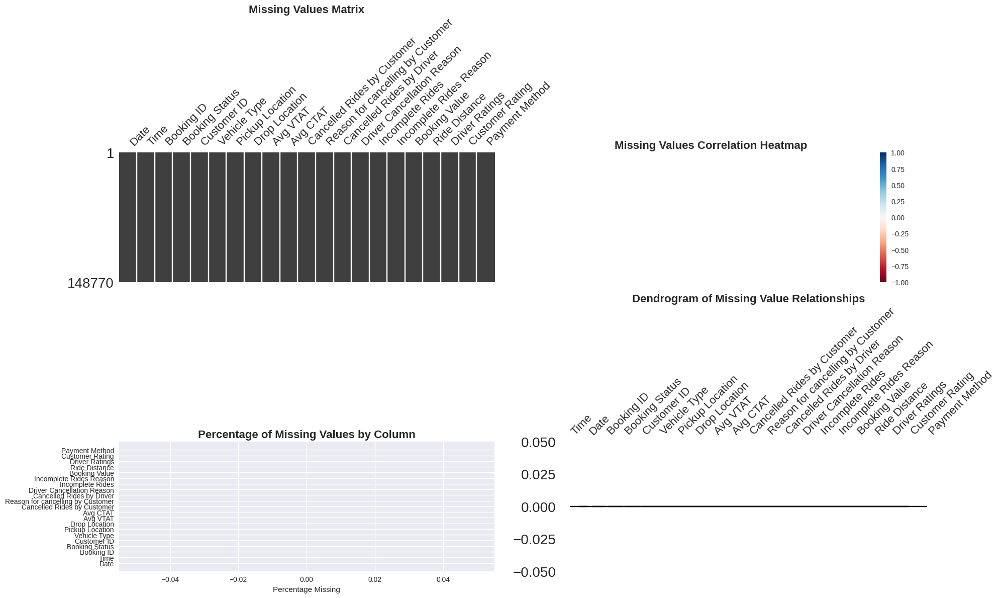

In [ ]:
# Advanced Missing Values Analysis
fig, axes = plt.subplots(2, 2, figsize=(20, 12))

# Missing values matrix
msno.matrix(uber_df, ax=axes[0,0])
axes[0,0].set_title('Missing Values Matrix', fontsize=16, fontweight='bold')

# Missing values heatmap
msno.heatmap(uber_df, ax=axes[0,1])
axes[0,1].set_title('Missing Values Correlation Heatmap', fontsize=16, fontweight='bold')

# Missing values bar plot
missing_percent = (uber_df.isnull().sum() / len(uber_df)) * 100
axes[1,0].barh(missing_percent.index, missing_percent.values)
axes[1,0].set_title('Percentage of Missing Values by Column', fontsize=16, fontweight='bold')
axes[1,0].set_xlabel('Percentage Missing')

# Dendrogram of missing values
msno.dendrogram(uber_df, ax=axes[1,1])
axes[1,1].set_title('Dendrogram of Missing Value Relationships', fontsize=16, fontweight='bold')

plt.tight_layout()
plt.show()

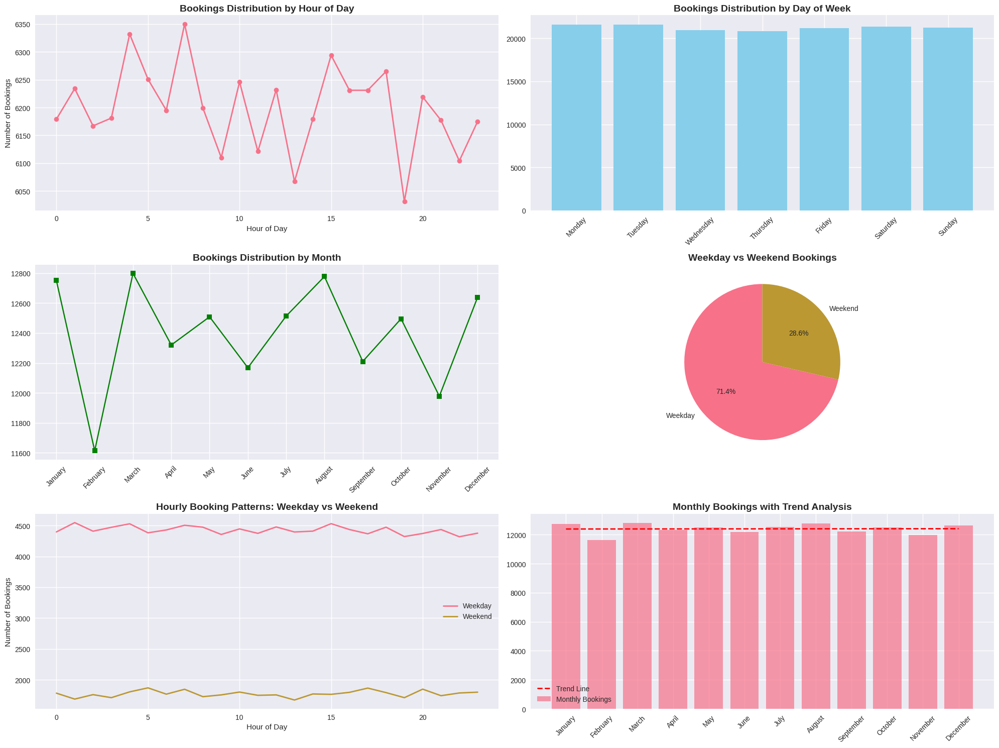

In [ ]:
# Temporal Analysis - Date and Time Patterns
uber_df['DateTime'] = pd.to_datetime(uber_df['Date'].astype(str) + ' ' + uber_df['Time'])
uber_df['Hour'] = uber_df['DateTime'].dt.hour
uber_df['DayOfWeek'] = uber_df['DateTime'].dt.day_name()
uber_df['Month'] = uber_df['DateTime'].dt.month_name()
uber_df['Weekend'] = uber_df['DayOfWeek'].isin(['Saturday', 'Sunday'])

# Create temporal analysis plots
fig, axes = plt.subplots(3, 2, figsize=(20, 15))

#  Bookings by Hour
hourly_bookings = uber_df['Hour'].value_counts().sort_index()
axes[0,0].plot(hourly_bookings.index, hourly_bookings.values, marker='o', linewidth=2)
axes[0,0].set_title('Bookings Distribution by Hour of Day', fontsize=14, fontweight='bold')
axes[0,0].set_xlabel('Hour of Day')
axes[0,0].set_ylabel('Number of Bookings')

#  Bookings by Day of Week
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
daily_bookings = uber_df['DayOfWeek'].value_counts().reindex(day_order)
axes[0,1].bar(daily_bookings.index, daily_bookings.values, color='skyblue')
axes[0,1].set_title('Bookings Distribution by Day of Week', fontsize=14, fontweight='bold')
axes[0,1].tick_params(axis='x', rotation=45)

# Bookings by Month
month_order = ['January', 'February', 'March', 'April', 'May', 'June',
               'July', 'August', 'September', 'October', 'November', 'December']
monthly_bookings = uber_df['Month'].value_counts().reindex(month_order)
axes[1,0].plot(monthly_bookings.index, monthly_bookings.values, marker='s', color='green')
axes[1,0].set_title('Bookings Distribution by Month', fontsize=14, fontweight='bold')
axes[1,0].tick_params(axis='x', rotation=45)

# Weekend vs Weekday Analysis
weekend_bookings = uber_df['Weekend'].value_counts()
axes[1,1].pie(weekend_bookings.values, labels=['Weekday', 'Weekend'], autopct='%1.1f%%', startangle=90)
axes[1,1].set_title('Weekday vs Weekend Bookings', fontsize=14, fontweight='bold')

#  Hourly Pattern by Day Type
weekday_hours = uber_df[~uber_df['Weekend']]['Hour'].value_counts().sort_index()
weekend_hours = uber_df[uber_df['Weekend']]['Hour'].value_counts().sort_index()
axes[2,0].plot(weekday_hours.index, weekday_hours.values, label='Weekday', linewidth=2)
axes[2,0].plot(weekend_hours.index, weekend_hours.values, label='Weekend', linewidth=2)
axes[2,0].set_title('Hourly Booking Patterns: Weekday vs Weekend', fontsize=14, fontweight='bold')
axes[2,0].set_xlabel('Hour of Day')
axes[2,0].set_ylabel('Number of Bookings')
axes[2,0].legend()

# Seasonal Trends by Month (with trend line)
monthly_trend = monthly_bookings.reset_index()
monthly_trend.columns = ['Month', 'Bookings']
z = np.polyfit(range(len(monthly_trend)), monthly_trend['Bookings'], 1)
p = np.poly1d(z)
axes[2,1].bar(monthly_trend['Month'], monthly_trend['Bookings'], alpha=0.7, label='Monthly Bookings')
axes[2,1].plot(monthly_trend['Month'], p(range(len(monthly_trend))), 'r--', linewidth=2, label='Trend Line')
axes[2,1].set_title('Monthly Bookings with Trend Analysis', fontsize=14, fontweight='bold')
axes[2,1].tick_params(axis='x', rotation=45)
axes[2,1].legend()

plt.tight_layout()
plt.show()

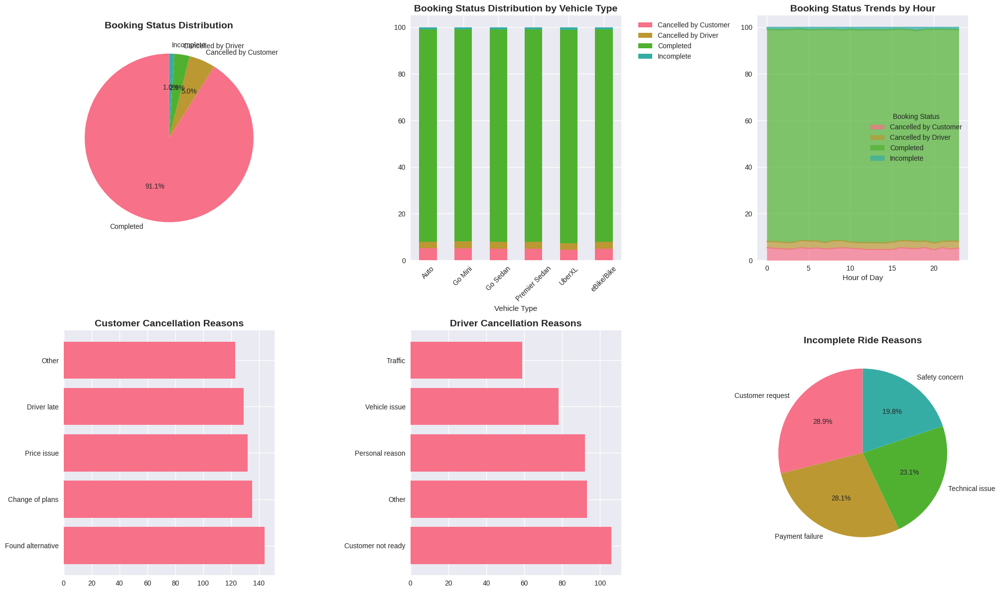

In [ ]:
# Booking Status Analysis
fig, axes = plt.subplots(2, 3, figsize=(20, 12))

# Booking Status Distribution
status_counts = uber_df['Booking Status'].value_counts()
axes[0,0].pie(status_counts.values, labels=status_counts.index, autopct='%1.1f%%', startangle=90)
axes[0,0].set_title('Booking Status Distribution', fontsize=14, fontweight='bold')

# Status by Vehicle Type
status_vehicle = pd.crosstab(uber_df['Vehicle Type'], uber_df['Booking Status'], normalize='index') * 100
status_vehicle.plot(kind='bar', stacked=True, ax=axes[0,1])
axes[0,1].set_title('Booking Status Distribution by Vehicle Type', fontsize=14, fontweight='bold')
axes[0,1].tick_params(axis='x', rotation=45)
axes[0,1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Status by Hour of Day
status_hour = pd.crosstab(uber_df['Hour'], uber_df['Booking Status'], normalize='index') * 100
status_hour.plot(kind='area', stacked=True, ax=axes[0,2], alpha=0.7)
axes[0,2].set_title('Booking Status Trends by Hour', fontsize=14, fontweight='bold')
axes[0,2].set_xlabel('Hour of Day')

#  Cancellation Reasons (Customer)
cust_cancel_reasons = uber_df[uber_df['Cancelled Rides by Customer'] == 1]['Reason for cancelling by Customer'].value_counts()
axes[1,0].barh(cust_cancel_reasons.index, cust_cancel_reasons.values)
axes[1,0].set_title('Customer Cancellation Reasons', fontsize=14, fontweight='bold')

# Cancellation Reasons (Driver)
driver_cancel_reasons = uber_df[uber_df['Cancelled Rides by Driver'] == 1]['Driver Cancellation Reason'].value_counts()
axes[1,1].barh(driver_cancel_reasons.index, driver_cancel_reasons.values)
axes[1,1].set_title('Driver Cancellation Reasons', fontsize=14, fontweight='bold')

# Incomplete Ride Reasons
incomplete_reasons = uber_df[uber_df['Incomplete Rides'] == 1]['Incomplete Rides Reason'].value_counts()
axes[1,2].pie(incomplete_reasons.values, labels=incomplete_reasons.index, autopct='%1.1f%%', startangle=90)
axes[1,2].set_title('Incomplete Ride Reasons', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

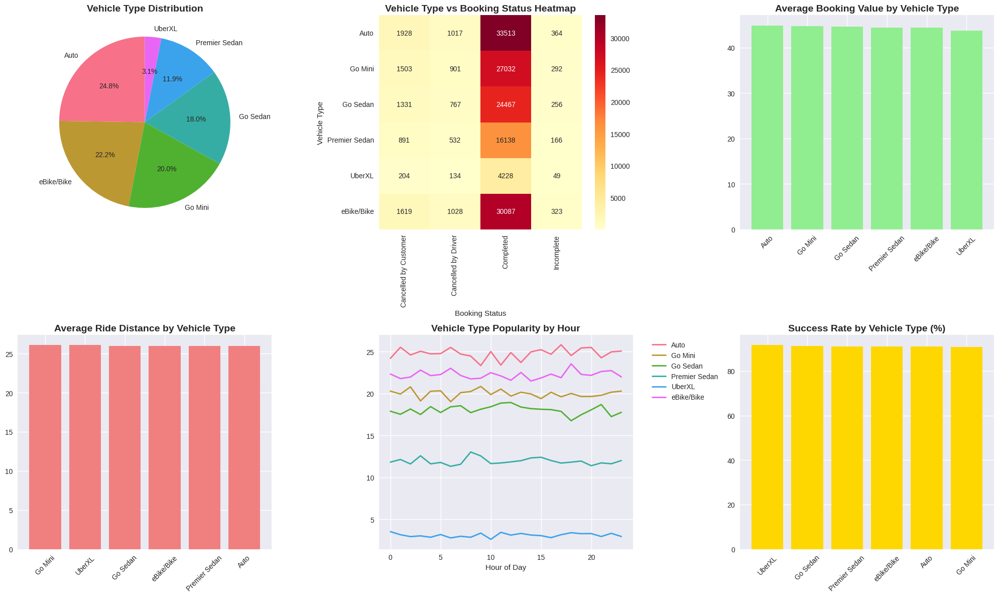

In [ ]:
# Vehicle Type Analysis
fig, axes = plt.subplots(2, 3, figsize=(20, 12))

# Vehicle Type Distribution
vehicle_counts = uber_df['Vehicle Type'].value_counts()
axes[0,0].pie(vehicle_counts.values, labels=vehicle_counts.index, autopct='%1.1f%%', startangle=90)
axes[0,0].set_title('Vehicle Type Distribution', fontsize=14, fontweight='bold')

#  Vehicle Type by Booking Status
vehicle_status = pd.crosstab(uber_df['Vehicle Type'], uber_df['Booking Status'])
sns.heatmap(vehicle_status, annot=True, fmt='d', cmap='YlOrRd', ax=axes[0,1])
axes[0,1].set_title('Vehicle Type vs Booking Status Heatmap', fontsize=14, fontweight='bold')

#  Average Booking Value by Vehicle Type
vehicle_value = uber_df.groupby('Vehicle Type')['Booking Value'].mean().sort_values(ascending=False)
axes[0,2].bar(vehicle_value.index, vehicle_value.values, color='lightgreen')
axes[0,2].set_title('Average Booking Value by Vehicle Type', fontsize=14, fontweight='bold')
axes[0,2].tick_params(axis='x', rotation=45)

#  Average Distance by Vehicle Type
vehicle_distance = uber_df.groupby('Vehicle Type')['Ride Distance'].mean().sort_values(ascending=False)
axes[1,0].bar(vehicle_distance.index, vehicle_distance.values, color='lightcoral')
axes[1,0].set_title('Average Ride Distance by Vehicle Type', fontsize=14, fontweight='bold')
axes[1,0].tick_params(axis='x', rotation=45)

#  Vehicle Type Popularity by Hour
vehicle_hour = pd.crosstab(uber_df['Hour'], uber_df['Vehicle Type'], normalize='index') * 100
vehicle_hour.plot(kind='line', ax=axes[1,1], linewidth=2)
axes[1,1].set_title('Vehicle Type Popularity by Hour', fontsize=14, fontweight='bold')
axes[1,1].set_xlabel('Hour of Day')
axes[1,1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

#  Success Rate by Vehicle Type
completed_by_vehicle = uber_df[uber_df['Booking Status'] == 'Completed'].groupby('Vehicle Type').size()
total_by_vehicle = uber_df.groupby('Vehicle Type').size()
success_rate = (completed_by_vehicle / total_by_vehicle * 100).sort_values(ascending=False)
axes[1,2].bar(success_rate.index, success_rate.values, color='gold')
axes[1,2].set_title('Success Rate by Vehicle Type (%)', fontsize=14, fontweight='bold')
axes[1,2].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

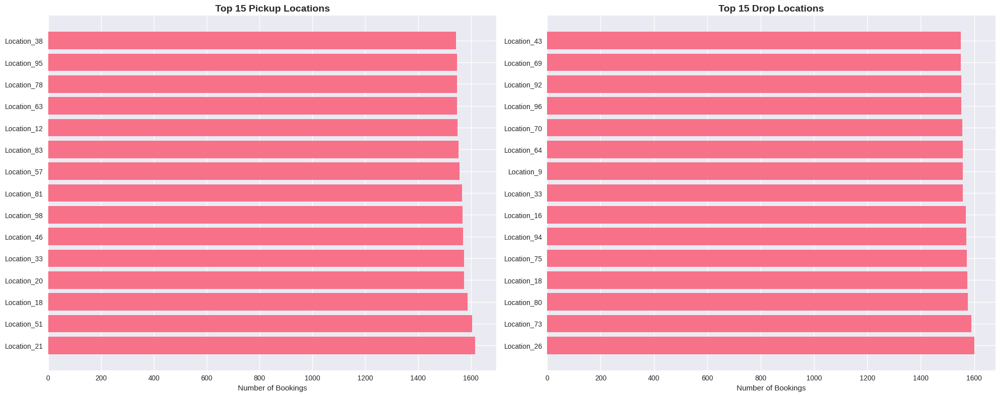

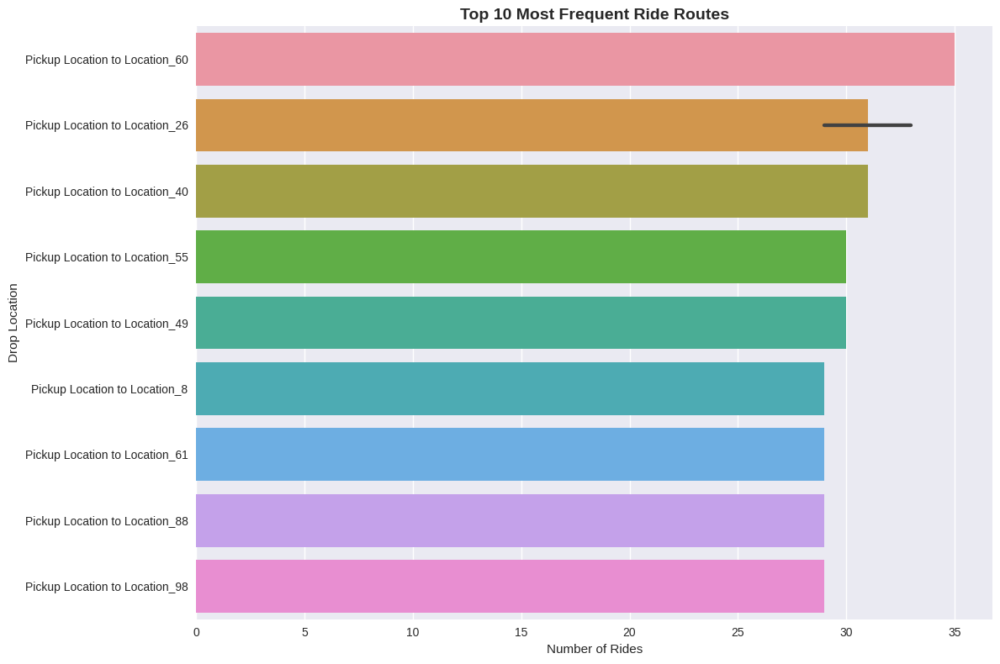

In [ ]:
# Geographic Analysis (Simulated Locations)
#  Top Pickup Locations
top_pickups = uber_df['Pickup Location'].value_counts().head(15)
top_drops = uber_df['Drop Location'].value_counts().head(15)

fig, axes = plt.subplots(1, 2, figsize=(20, 8))

axes[0].barh(range(len(top_pickups)), top_pickups.values)
axes[0].set_yticks(range(len(top_pickups)))
axes[0].set_yticklabels(top_pickups.index)
axes[0].set_title('Top 15 Pickup Locations', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Number of Bookings')

axes[1].barh(range(len(top_drops)), top_drops.values)
axes[1].set_yticks(range(len(top_drops)))
axes[1].set_yticklabels(top_drops.index)
axes[1].set_title('Top 15 Drop Locations', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Number of Bookings')

plt.tight_layout()
plt.show()

#  Location Pair Analysis
location_pairs = uber_df.groupby(['Pickup Location', 'Drop Location']).size().reset_index(name='Count')
top_pairs = location_pairs.nlargest(10, 'Count')

plt.figure(figsize=(12, 8))
sns.barplot(data=top_pairs, y='Pickup Location' + ' to ' + top_pairs['Drop Location'], x='Count')
plt.title('Top 10 Most Frequent Ride Routes', fontsize=14, fontweight='bold')
plt.xlabel('Number of Rides')
plt.tight_layout()
plt.show()

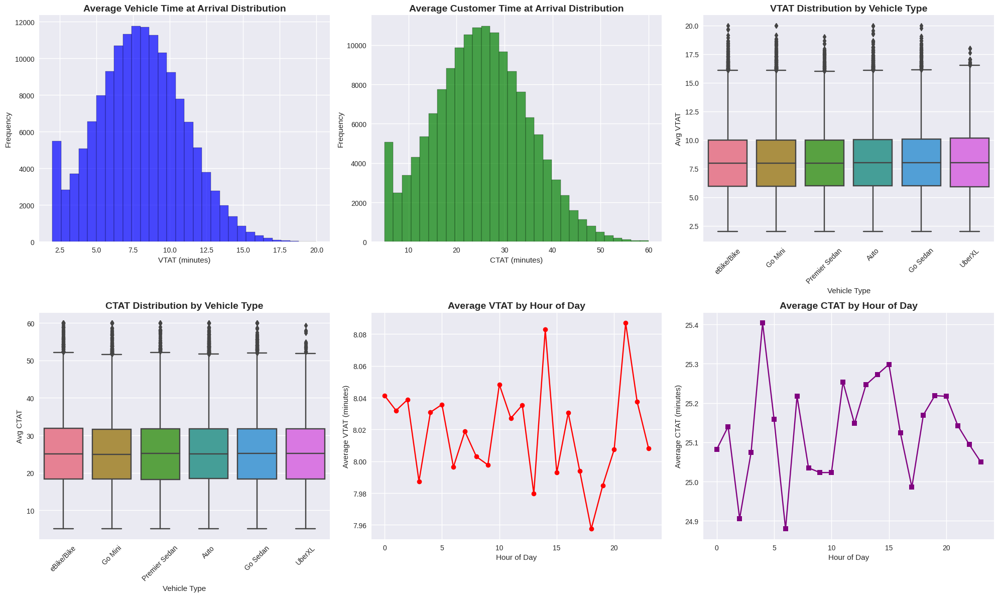

In [ ]:
#  Time Performance Metrics Analysis
fig, axes = plt.subplots(2, 3, figsize=(20, 12))

#  VTAT Distribution
axes[0,0].hist(uber_df['Avg VTAT'], bins=30, alpha=0.7, color='blue', edgecolor='black')
axes[0,0].set_title('Average Vehicle Time at Arrival Distribution', fontsize=14, fontweight='bold')
axes[0,0].set_xlabel('VTAT (minutes)')
axes[0,0].set_ylabel('Frequency')

#  CTAT Distribution
axes[0,1].hist(uber_df['Avg CTAT'], bins=30, alpha=0.7, color='green', edgecolor='black')
axes[0,1].set_title('Average Customer Time at Arrival Distribution', fontsize=14, fontweight='bold')
axes[0,1].set_xlabel('CTAT (minutes)')
axes[0,1].set_ylabel('Frequency')

#  VTAT by Vehicle Type
sns.boxplot(data=uber_df, x='Vehicle Type', y='Avg VTAT', ax=axes[0,2])
axes[0,2].set_title('VTAT Distribution by Vehicle Type', fontsize=14, fontweight='bold')
axes[0,2].tick_params(axis='x', rotation=45)

#  CTAT by Vehicle Type
sns.boxplot(data=uber_df, x='Vehicle Type', y='Avg CTAT', ax=axes[1,0])
axes[1,0].set_title('CTAT Distribution by Vehicle Type', fontsize=14, fontweight='bold')
axes[1,0].tick_params(axis='x', rotation=45)

#  VTAT by Hour of Day
hourly_vtat = uber_df.groupby('Hour')['Avg VTAT'].mean()
axes[1,1].plot(hourly_vtat.index, hourly_vtat.values, marker='o', color='red')
axes[1,1].set_title('Average VTAT by Hour of Day', fontsize=14, fontweight='bold')
axes[1,1].set_xlabel('Hour of Day')
axes[1,1].set_ylabel('Average VTAT (minutes)')

#  CTAT by Hour of Day
hourly_ctat = uber_df.groupby('Hour')['Avg CTAT'].mean()
axes[1,2].plot(hourly_ctat.index, hourly_ctat.values, marker='s', color='purple')
axes[1,2].set_title('Average CTAT by Hour of Day', fontsize=14, fontweight='bold')
axes[1,2].set_xlabel('Hour of Day')
axes[1,2].set_ylabel('Average CTAT (minutes)')

plt.tight_layout()
plt.show()

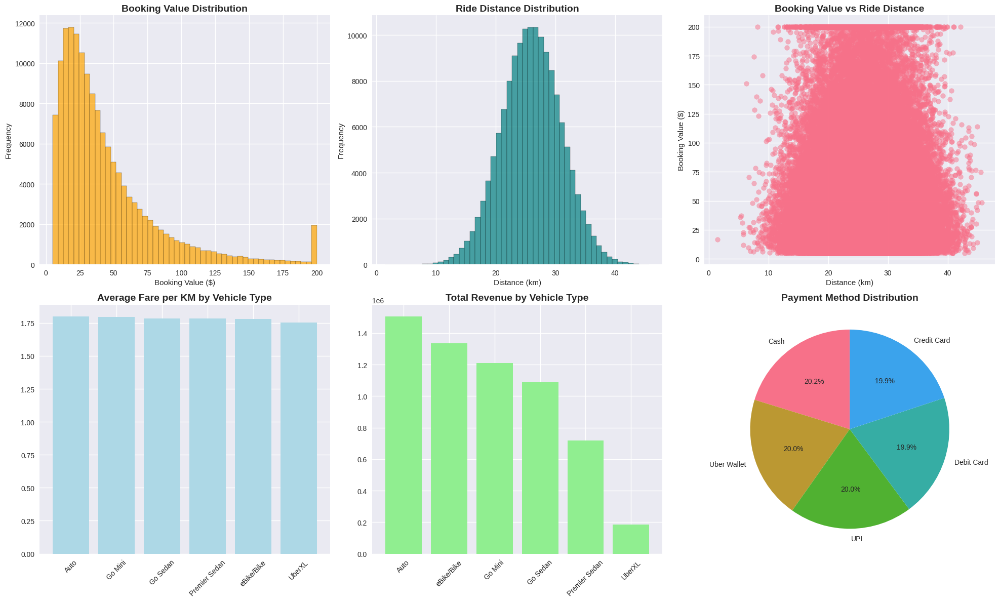

In [ ]:
#  Financial Analysis
fig, axes = plt.subplots(2, 3, figsize=(20, 12))

#  Booking Value Distribution
axes[0,0].hist(uber_df['Booking Value'], bins=50, alpha=0.7, color='orange', edgecolor='black')
axes[0,0].set_title('Booking Value Distribution', fontsize=14, fontweight='bold')
axes[0,0].set_xlabel('Booking Value ($)')
axes[0,0].set_ylabel('Frequency')

#  Ride Distance Distribution
axes[0,1].hist(uber_df['Ride Distance'], bins=50, alpha=0.7, color='teal', edgecolor='black')
axes[0,1].set_title('Ride Distance Distribution', fontsize=14, fontweight='bold')
axes[0,1].set_xlabel('Distance (km)')
axes[0,1].set_ylabel('Frequency')

#  Value vs Distance Correlation
completed_rides = uber_df[uber_df['Booking Status'] == 'Completed']
axes[0,2].scatter(completed_rides['Ride Distance'], completed_rides['Booking Value'], alpha=0.5)
axes[0,2].set_title('Booking Value vs Ride Distance', fontsize=14, fontweight='bold')
axes[0,2].set_xlabel('Distance (km)')
axes[0,2].set_ylabel('Booking Value ($)')

#  Average Fare per KM by Vehicle Type
completed_rides['Fare_per_km'] = completed_rides['Booking Value'] / completed_rides['Ride Distance']
fare_per_km = completed_rides.groupby('Vehicle Type')['Fare_per_km'].mean().sort_values(ascending=False)
axes[1,0].bar(fare_per_km.index, fare_per_km.values, color='lightblue')
axes[1,0].set_title('Average Fare per KM by Vehicle Type', fontsize=14, fontweight='bold')
axes[1,0].tick_params(axis='x', rotation=45)

#  Revenue by Vehicle Type
revenue_by_vehicle = completed_rides.groupby('Vehicle Type')['Booking Value'].sum().sort_values(ascending=False)
axes[1,1].bar(revenue_by_vehicle.index, revenue_by_vehicle.values, color='lightgreen')
axes[1,1].set_title('Total Revenue by Vehicle Type', fontsize=14, fontweight='bold')
axes[1,1].tick_params(axis='x', rotation=45)

# Payment Method Distribution
payment_methods = uber_df['Payment Method'].value_counts()
axes[1,2].pie(payment_methods.values, labels=payment_methods.index, autopct='%1.1f%%', startangle=90)
axes[1,2].set_title('Payment Method Distribution', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

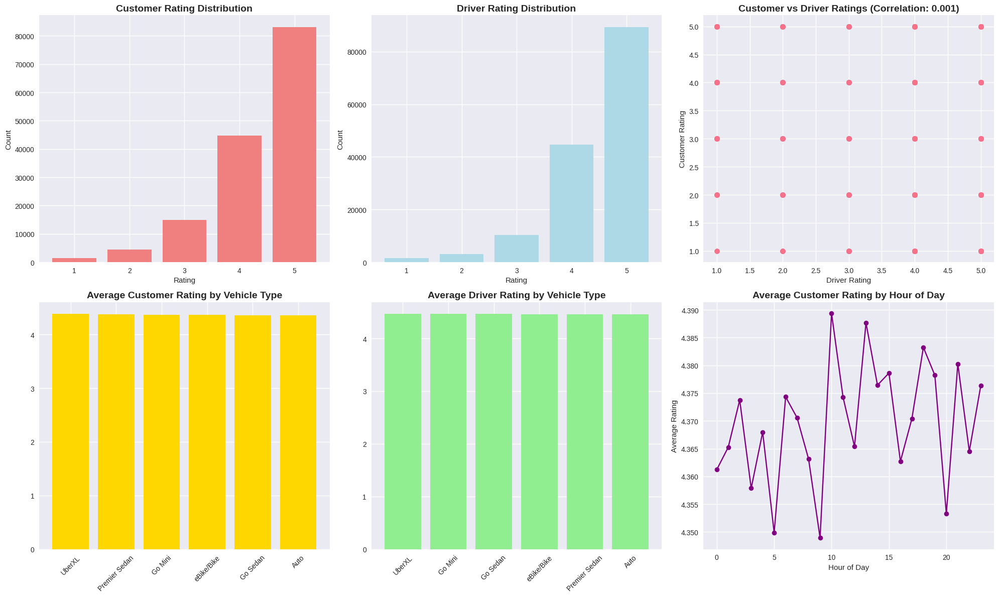

In [ ]:
# Customer Behavior Analysis
fig, axes = plt.subplots(2, 3, figsize=(20, 12))

#  Customer Rating Distribution
customer_ratings = uber_df['Customer Rating'].value_counts().sort_index()
axes[0,0].bar(customer_ratings.index, customer_ratings.values, color='lightcoral')
axes[0,0].set_title('Customer Rating Distribution', fontsize=14, fontweight='bold')
axes[0,0].set_xlabel('Rating')
axes[0,0].set_ylabel('Count')

#  Driver Rating Distribution
driver_ratings = uber_df['Driver Ratings'].value_counts().sort_index()
axes[0,1].bar(driver_ratings.index, driver_ratings.values, color='lightblue')
axes[0,1].set_title('Driver Rating Distribution', fontsize=14, fontweight='bold')
axes[0,1].set_xlabel('Rating')
axes[0,1].set_ylabel('Count')

#  Rating Correlation
rating_corr = uber_df[['Customer Rating', 'Driver Ratings']].corr().iloc[0,1]
axes[0,2].scatter(uber_df['Driver Ratings'], uber_df['Customer Rating'], alpha=0.3)
axes[0,2].set_title(f'Customer vs Driver Ratings (Correlation: {rating_corr:.3f})', fontsize=14, fontweight='bold')
axes[0,2].set_xlabel('Driver Rating')
axes[0,2].set_ylabel('Customer Rating')

#  Ratings by Vehicle Type
vehicle_customer_ratings = uber_df.groupby('Vehicle Type')['Customer Rating'].mean().sort_values(ascending=False)
axes[1,0].bar(vehicle_customer_ratings.index, vehicle_customer_ratings.values, color='gold')
axes[1,0].set_title('Average Customer Rating by Vehicle Type', fontsize=14, fontweight='bold')
axes[1,0].tick_params(axis='x', rotation=45)

vehicle_driver_ratings = uber_df.groupby('Vehicle Type')['Driver Ratings'].mean().sort_values(ascending=False)
axes[1,1].bar(vehicle_driver_ratings.index, vehicle_driver_ratings.values, color='lightgreen')
axes[1,1].set_title('Average Driver Rating by Vehicle Type', fontsize=14, fontweight='bold')
axes[1,1].tick_params(axis='x', rotation=45)

#  Ratings by Hour of Day
hourly_customer_rating = uber_df.groupby('Hour')['Customer Rating'].mean()
axes[1,2].plot(hourly_customer_rating.index, hourly_customer_rating.values, marker='o', color='purple')
axes[1,2].set_title('Average Customer Rating by Hour of Day', fontsize=14, fontweight='bold')
axes[1,2].set_xlabel('Hour of Day')
axes[1,2].set_ylabel('Average Rating')

plt.tight_layout()
plt.show()

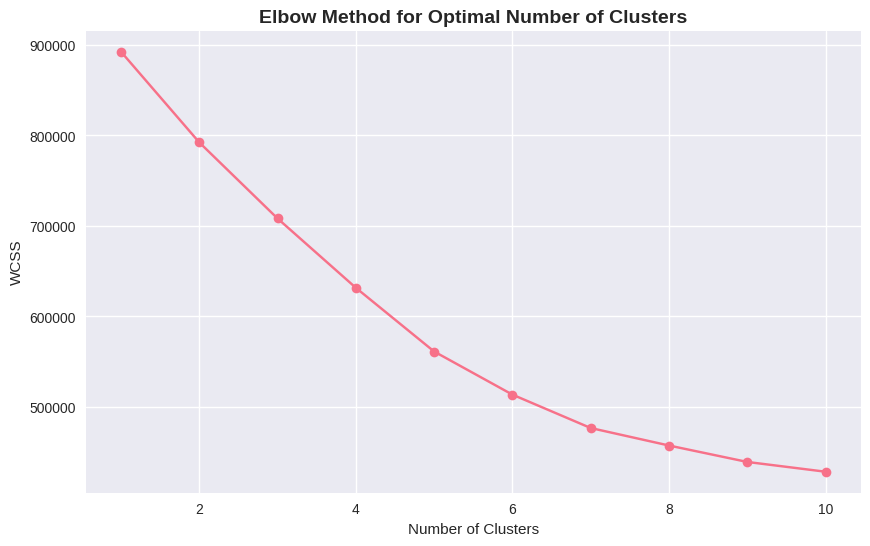

Cluster Analysis:
         Booking Value  Ride Distance  Avg VTAT   Avg CTAT  Customer Rating  \
Cluster                                                                       
0            37.583613      26.050164  8.026015  25.030108         2.632843   
1           128.830498      26.026424  8.055989  25.055200         4.478733   
2            33.710613      25.659361  8.729372  32.994749         4.649001   
3            33.667722      26.334280  7.328331  17.684893         4.653651   

         Driver Ratings  
Cluster                  
0              4.453602  
1              4.464555  
2              4.475005  
3              4.446952  


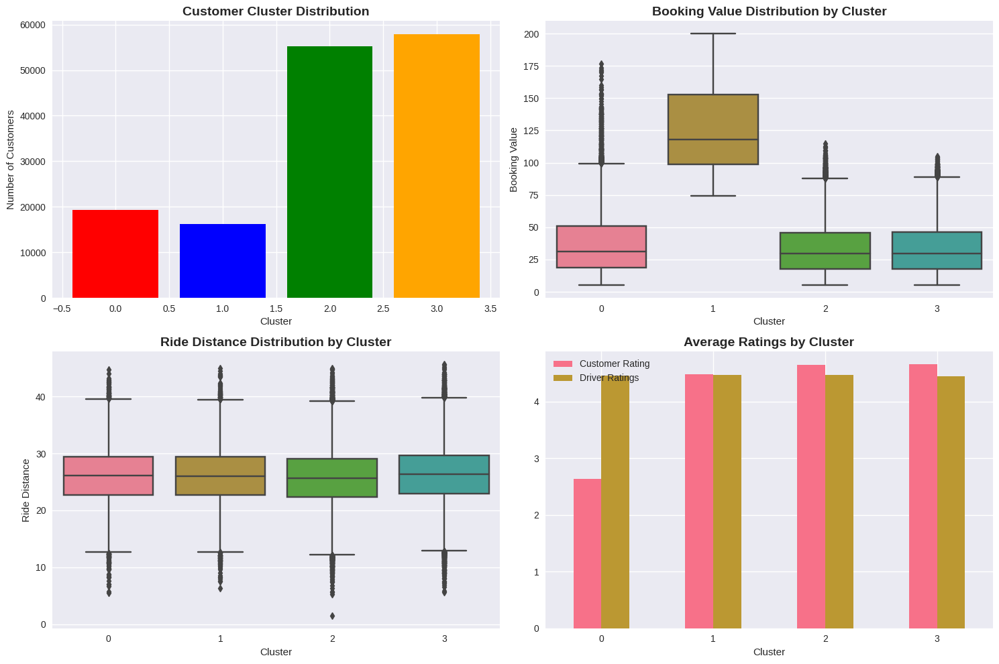

In [ ]:
# Advanced Analytics - Customer Segmentation
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Prepare data for clustering
cluster_data = uber_df[['Booking Value', 'Ride Distance', 'Avg VTAT', 'Avg CTAT', 'Customer Rating', 'Driver Ratings']].copy()
cluster_data = cluster_data.dropna()

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(cluster_data)

# Determine optimal number of clusters using elbow method
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(scaled_data)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), wcss, marker='o')
plt.title('Elbow Method for Optimal Number of Clusters', fontsize=14, fontweight='bold')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

# Apply K-means clustering
kmeans = KMeans(n_clusters=4, random_state=42)
clusters = kmeans.fit_predict(scaled_data)
cluster_data['Cluster'] = clusters

# Analyze clusters
cluster_analysis = cluster_data.groupby('Cluster').mean()
print("Cluster Analysis:")
print(cluster_analysis)

# Visualize clusters
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Cluster distribution
cluster_counts = cluster_data['Cluster'].value_counts().sort_index()
axes[0,0].bar(cluster_counts.index, cluster_counts.values, color=['red', 'blue', 'green', 'orange'])
axes[0,0].set_title('Customer Cluster Distribution', fontsize=14, fontweight='bold')
axes[0,0].set_xlabel('Cluster')
axes[0,0].set_ylabel('Number of Customers')

# Booking Value by Cluster
sns.boxplot(data=cluster_data, x='Cluster', y='Booking Value', ax=axes[0,1])
axes[0,1].set_title('Booking Value Distribution by Cluster', fontsize=14, fontweight='bold')

# Ride Distance by Cluster
sns.boxplot(data=cluster_data, x='Cluster', y='Ride Distance', ax=axes[1,0])
axes[1,0].set_title('Ride Distance Distribution by Cluster', fontsize=14, fontweight='bold')

# Ratings by Cluster
cluster_ratings = cluster_data.groupby('Cluster')[['Customer Rating', 'Driver Ratings']].mean()
cluster_ratings.plot(kind='bar', ax=axes[1,1])
axes[1,1].set_title('Average Ratings by Cluster', fontsize=14, fontweight='bold')
axes[1,1].tick_params(axis='x', rotation=0)

plt.tight_layout()
plt.show()

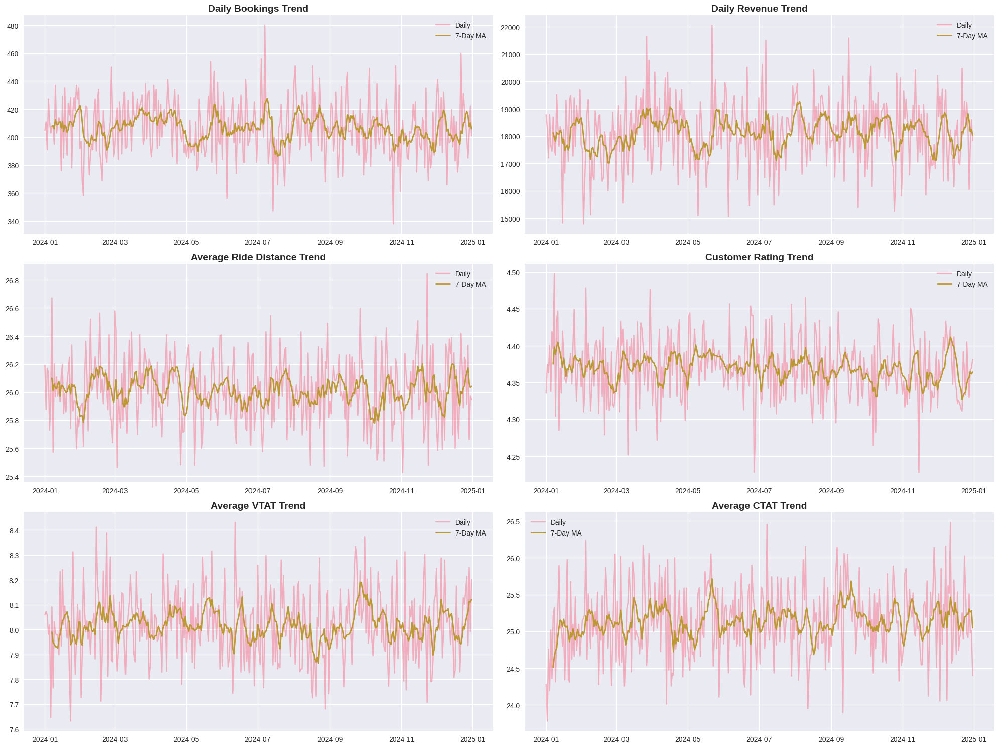

In [ ]:
# Convert to time series data
daily_metrics = uber_df.groupby('Date').agg({
    'Booking ID': 'count',
    'Booking Value': 'sum',
    'Ride Distance': 'mean',
    'Customer Rating': 'mean',
    'Avg VTAT': 'mean',
    'Avg CTAT': 'mean'
}).rename(columns={'Booking ID': 'Daily_Bookings', 'Booking Value': 'Daily_Revenue'})

# Calculate 7-day moving averages
daily_metrics['Bookings_MA7'] = daily_metrics['Daily_Bookings'].rolling(window=7).mean()
daily_metrics['Revenue_MA7'] = daily_metrics['Daily_Revenue'].rolling(window=7).mean()

fig, axes = plt.subplots(3, 2, figsize=(20, 15))

#  Daily Bookings Trend
axes[0,0].plot(daily_metrics.index, daily_metrics['Daily_Bookings'], alpha=0.5, label='Daily')
axes[0,0].plot(daily_metrics.index, daily_metrics['Bookings_MA7'], linewidth=2, label='7-Day MA')
axes[0,0].set_title('Daily Bookings Trend', fontsize=14, fontweight='bold')
axes[0,0].legend()

#  Daily Revenue Trend
axes[0,1].plot(daily_metrics.index, daily_metrics['Daily_Revenue'], alpha=0.5, label='Daily')
axes[0,1].plot(daily_metrics.index, daily_metrics['Revenue_MA7'], linewidth=2, label='7-Day MA')
axes[0,1].set_title('Daily Revenue Trend', fontsize=14, fontweight='bold')
axes[0,1].legend()

#  Average Ride Distance Trend
daily_metrics['Distance_MA7'] = daily_metrics['Ride Distance'].rolling(window=7).mean()
axes[1,0].plot(daily_metrics.index, daily_metrics['Ride Distance'], alpha=0.5, label='Daily')
axes[1,0].plot(daily_metrics.index, daily_metrics['Distance_MA7'], linewidth=2, label='7-Day MA')
axes[1,0].set_title('Average Ride Distance Trend', fontsize=14, fontweight='bold')
axes[1,0].legend()

#  Customer Rating Trend
daily_metrics['Rating_MA7'] = daily_metrics['Customer Rating'].rolling(window=7).mean()
axes[1,1].plot(daily_metrics.index, daily_metrics['Customer Rating'], alpha=0.5, label='Daily')
axes[1,1].plot(daily_metrics.index, daily_metrics['Rating_MA7'], linewidth=2, label='7-Day MA')
axes[1,1].set_title('Customer Rating Trend', fontsize=14, fontweight='bold')
axes[1,1].legend()

#  VTAT Trend
daily_metrics['VTAT_MA7'] = daily_metrics['Avg VTAT'].rolling(window=7).mean()
axes[2,0].plot(daily_metrics.index, daily_metrics['Avg VTAT'], alpha=0.5, label='Daily')
axes[2,0].plot(daily_metrics.index, daily_metrics['VTAT_MA7'], linewidth=2, label='7-Day MA')
axes[2,0].set_title('Average VTAT Trend', fontsize=14, fontweight='bold')
axes[2,0].legend()

#  CTAT Trend
daily_metrics['CTAT_MA7'] = daily_metrics['Avg CTAT'].rolling(window=7).mean()
axes[2,1].plot(daily_metrics.index, daily_metrics['Avg CTAT'], alpha=0.5, label='Daily')
axes[2,1].plot(daily_metrics.index, daily_metrics['CTAT_MA7'], linewidth=2, label='7-Day MA')
axes[2,1].set_title('Average CTAT Trend', fontsize=14, fontweight='bold')
axes[2,1].legend()

plt.tight_layout()
plt.show()

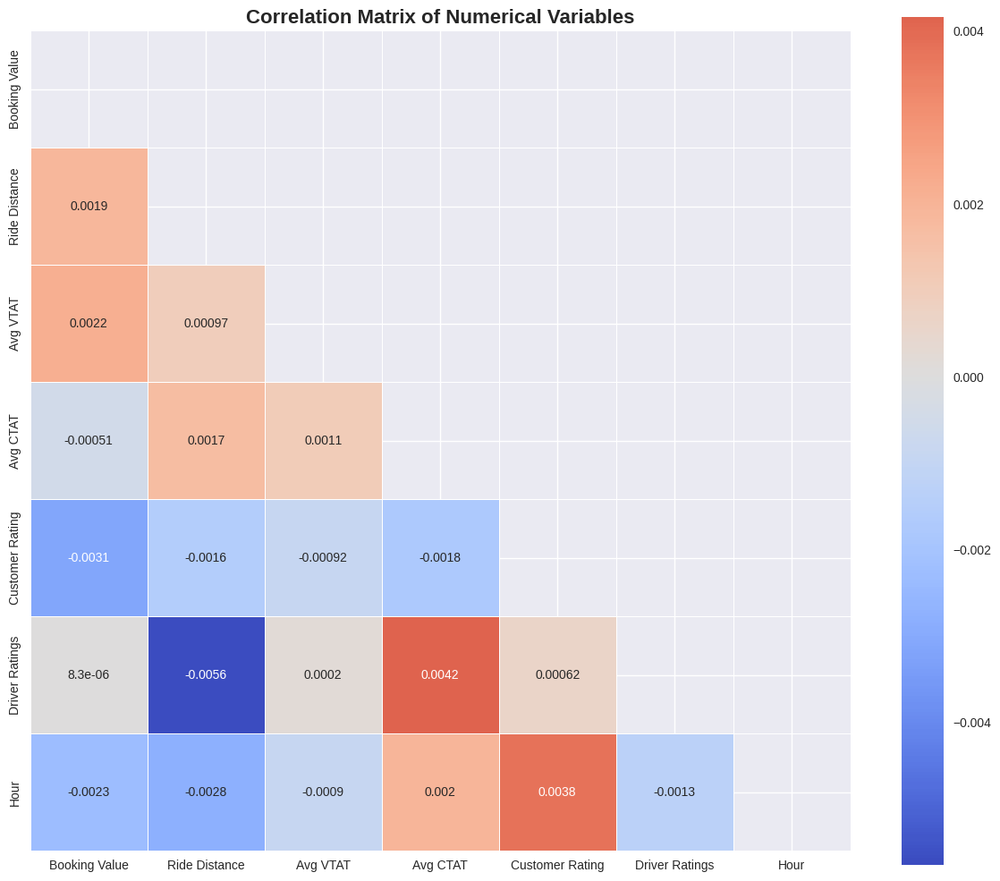

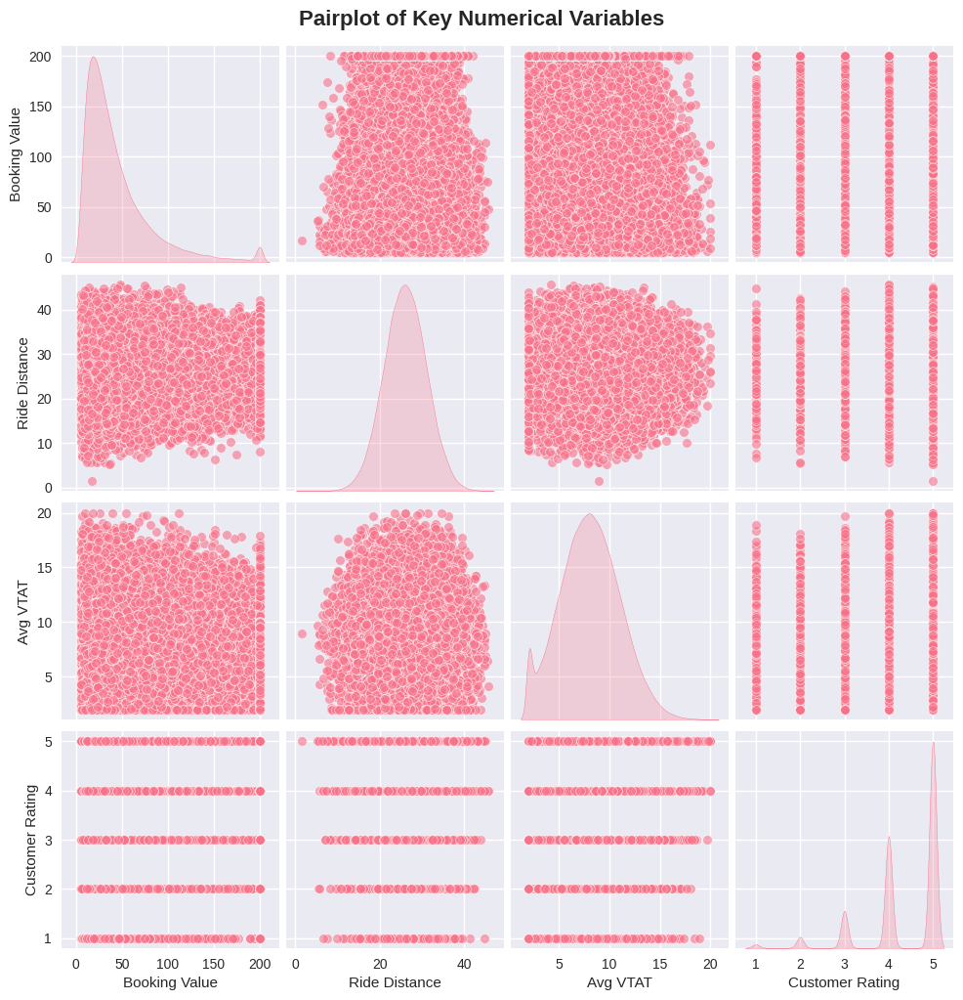

In [ ]:
#  Correlation Analysis
numerical_cols = ['Booking Value', 'Ride Distance', 'Avg VTAT', 'Avg CTAT',
                 'Customer Rating', 'Driver Ratings', 'Hour']

correlation_data = uber_df[numerical_cols].copy()

# Calculate correlation matrix
corr_matrix = correlation_data.corr()

# Create correlation heatmap
plt.figure(figsize=(12, 10))
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='coolwarm', center=0,
            square=True, linewidths=0.5)
plt.title('Correlation Matrix of Numerical Variables', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# Pairplot for selected variables
sns.pairplot(correlation_data[['Booking Value', 'Ride Distance', 'Avg VTAT', 'Customer Rating']],
             diag_kind='kde', plot_kws={'alpha': 0.6})
plt.suptitle('Pairplot of Key Numerical Variables', y=1.02, fontsize=16, fontweight='bold')
plt.show()

In [ ]:
#  Advanced Visualizations with Plotly
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

#  Interactive Time Series
fig = make_subplots(rows=2, cols=2, subplot_titles=('Daily Bookings', 'Daily Revenue',
                                                   'Average Rating', 'Average Distance'))

# Daily Bookings
fig.add_trace(go.Scatter(x=daily_metrics.index, y=daily_metrics['Daily_Bookings'],
                        name='Daily Bookings', line=dict(color='blue')), row=1, col=1)

# Daily Revenue
fig.add_trace(go.Scatter(x=daily_metrics.index, y=daily_metrics['Daily_Revenue'],
                        name='Daily Revenue', line=dict(color='green')), row=1, col=2)

# Average Rating
fig.add_trace(go.Scatter(x=daily_metrics.index, y=daily_metrics['Customer Rating'],
                        name='Avg Rating', line=dict(color='red')), row=2, col=1)

# Average Distance
fig.add_trace(go.Scatter(x=daily_metrics.index, y=daily_metrics['Ride Distance'],
                        name='Avg Distance', line=dict(color='purple')), row=2, col=2)

fig.update_layout(height=600, title_text="Interactive Time Series Dashboard",
                  showlegend=False)
fig.show()

#  Sunburst Chart for Vehicle Type and Status
status_vehicle_count = uber_df.groupby(['Vehicle Type', 'Booking Status']).size().reset_index(name='Count')
fig = px.sunburst(status_vehicle_count, path=['Vehicle Type', 'Booking Status'], values='Count',
                 title='Vehicle Type and Booking Status Distribution')
fig.show()

# 3D Scatter Plot
fig = px.scatter_3d(uber_df.sample(1000), x='Ride Distance', y='Booking Value', z='Avg CTAT',
                   color='Vehicle Type', size='Customer Rating',
                   title='3D Relationship: Distance, Value, and CTAT')
fig.show()

In [ ]:
# Statistical Tests and Hypothesis Testing
from scipy import stats

print("=== STATISTICAL ANALYSIS ===")

#  Test if there's significant difference in booking values between weekdays and weekends
weekday_values = uber_df[~uber_df['Weekend']]['Booking Value']
weekend_values = uber_df[uber_df['Weekend']]['Booking Value']

t_stat, p_value = stats.ttest_ind(weekday_values, weekend_values, equal_var=False)
print(f"Weekday vs Weekend Booking Value T-test: t={t_stat:.3f}, p={p_value:.3f}")

#  ANOVA test for booking value across vehicle types
vehicle_groups = [uber_df[uber_df['Vehicle Type'] == vt]['Booking Value'] for vt in uber_df['Vehicle Type'].unique()]
f_stat, p_value = stats.f_oneway(*vehicle_groups)
print(f"ANOVA for Booking Value across Vehicle Types: F={f_stat:.3f}, p={p_value:.3f}")

#  Correlation tests
corr_distance_value, p_distance = stats.pearsonr(uber_df['Ride Distance'], uber_df['Booking Value'])
print(f"Distance vs Value Correlation: r={corr_distance_value:.3f}, p={p_distance:.3f}")

# Chi-square test for vehicle type and booking status
contingency_table = pd.crosstab(uber_df['Vehicle Type'], uber_df['Booking Status'])
chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)
print(f"Chi-square test for Vehicle Type vs Booking Status: χ²={chi2:.3f}, p={p_value:.3f}")

#  Normality tests for key metrics
print("\nNormality Tests (Shapiro-Wilk):")
for col in ['Booking Value', 'Ride Distance', 'Avg VTAT', 'Avg CTAT']:
    stat, p = stats.shapiro(uber_df[col].dropna())
    print(f"{col}: W={stat:.3f}, p={p:.3f} {'(Normal)' if p > 0.05 else '(Not Normal)'}")

=== STATISTICAL ANALYSIS ===
Weekday vs Weekend Booking Value T-test: t=0.818, p=0.413
ANOVA for Booking Value across Vehicle Types: F=1.235, p=0.289
Distance vs Value Correlation: r=0.002, p=0.454
Chi-square test for Vehicle Type vs Booking Status: χ²=17.950, p=0.265

Normality Tests (Shapiro-Wilk):
Booking Value: W=0.804, p=0.000 (Not Normal)
Ride Distance: W=1.000, p=0.893 (Normal)
Avg VTAT: W=0.994, p=0.000 (Not Normal)
Avg CTAT: W=0.995, p=0.000 (Not Normal)


=== CANCELLATION PREDICTION MODEL ===
ROC-AUC Score: 0.504

Classification Report:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96     41075
           1       0.08      0.00      0.00      3556

    accuracy                           0.92     44631
   macro avg       0.50      0.50      0.48     44631
weighted avg       0.85      0.92      0.88     44631



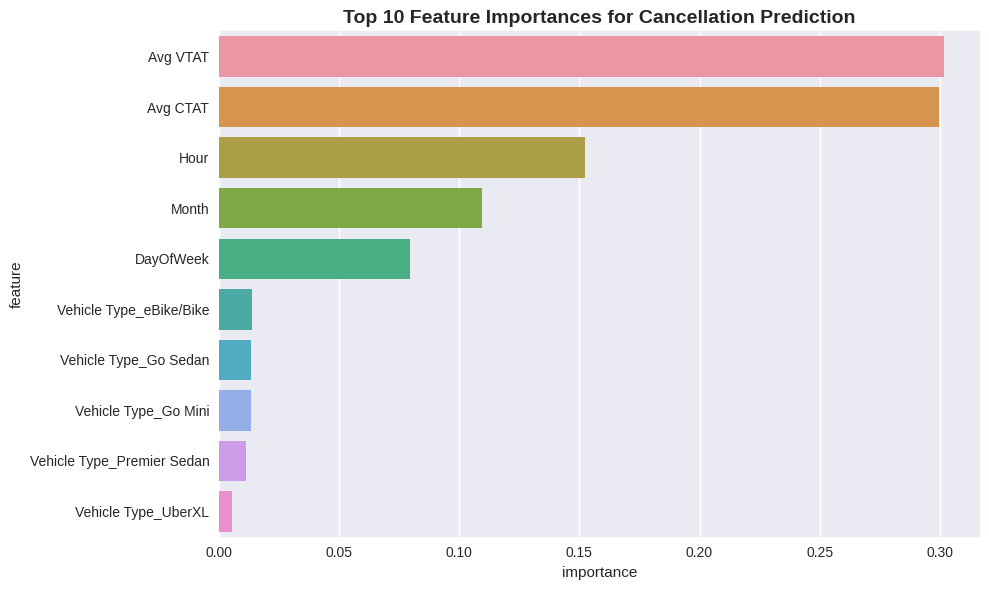

In [ ]:
#  Predictive Analytics - Cancellation Prediction
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score

# Prepare data for cancellation prediction
pred_data = uber_df.copy()

# Create target variable: 1 if cancelled (by customer or driver), 0 otherwise
pred_data['Is_Cancelled'] = ((pred_data['Booking Status'] == 'Cancelled by Customer') |
                            (pred_data['Booking Status'] == 'Cancelled by Driver')).astype(int)

# Feature engineering
pred_data['Hour'] = pred_data['DateTime'].dt.hour
pred_data['DayOfWeek'] = pred_data['DateTime'].dt.dayofweek
pred_data['Month'] = pred_data['DateTime'].dt.month

# Select features and target
features = ['Vehicle Type', 'Hour', 'DayOfWeek', 'Month', 'Avg VTAT', 'Avg CTAT']
X = pd.get_dummies(pred_data[features], drop_first=True)
y = pred_data['Is_Cancelled']

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

# Train model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
rf_model.fit(X_train, y_train)

# Predictions
y_pred = rf_model.predict(X_test)
y_pred_proba = rf_model.predict_proba(X_test)[:, 1]

# Evaluation
print("=== CANCELLATION PREDICTION MODEL ===")
print(f"ROC-AUC Score: {roc_auc_score(y_test, y_pred_proba):.3f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Feature importance
feature_importance = pd.DataFrame({
    'feature': X.columns,
    'importance': rf_model.feature_importances_
}).sort_values('importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(data=feature_importance.head(10), x='importance', y='feature')
plt.title('Top 10 Feature Importances for Cancellation Prediction', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

=== NETWORK ANALYSIS OF RIDE ROUTES ===
Network Nodes: 86
Network Edges: 100
Network Density: 0.0137

Top 10 Hub Locations (Degree Centrality):
  Location_98: 0.0706
  Location_26: 0.0588
  Location_90: 0.0588
  Location_51: 0.0588
  Location_43: 0.0588
  Location_46: 0.0471
  Location_49: 0.0471
  Location_5: 0.0471
  Location_8: 0.0471
  Location_65: 0.0471

Top 10 Critical Locations (Betweenness Centrality):
  Location_49: 0.0307
  Location_75: 0.0268
  Location_98: 0.0254
  Location_80: 0.0238
  Location_90: 0.0223
  Location_43: 0.0176
  Location_48: 0.0167
  Location_27: 0.0143
  Location_65: 0.0137
  Location_26: 0.0134


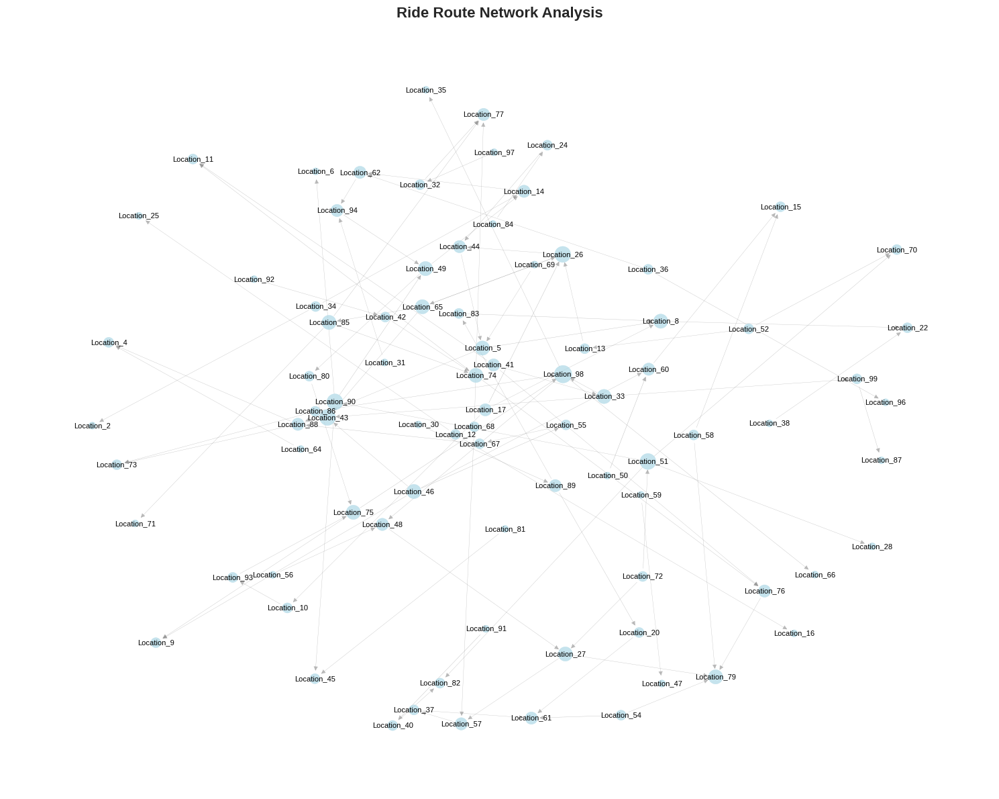

In [ ]:
#  Network Analysis of Ride Routes
import networkx as nx
from collections import Counter

# Create location network graph
print("=== NETWORK ANALYSIS OF RIDE ROUTES ===")

# Get top location pairs
location_pairs = uber_df.groupby(['Pickup Location', 'Drop Location']).size().reset_index(name='Count')
top_100_pairs = location_pairs.nlargest(100, 'Count')

# Create directed graph
G = nx.DiGraph()

# Add edges with weights
for _, row in top_100_pairs.iterrows():
    G.add_edge(row['Pickup Location'], row['Drop Location'], weight=row['Count'])

# Calculate network metrics
print(f"Network Nodes: {G.number_of_nodes()}")
print(f"Network Edges: {G.number_of_edges()}")
print(f"Network Density: {nx.density(G):.4f}")

# Degree centrality
degree_centrality = nx.degree_centrality(G)
top_hubs = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:10]

print("\nTop 10 Hub Locations (Degree Centrality):")
for loc, centrality in top_hubs:
    print(f"  {loc}: {centrality:.4f}")

# Betweenness centrality
betweenness = nx.betweenness_centrality(G)
top_betweenness = sorted(betweenness.items(), key=lambda x: x[1], reverse=True)[:10]

print("\nTop 10 Critical Locations (Betweenness Centrality):")
for loc, centrality in top_betweenness:
    print(f"  {loc}: {centrality:.4f}")

# Visualize the network
plt.figure(figsize=(15, 12))
pos = nx.spring_layout(G, k=1, iterations=50)

# Node size by degree
node_sizes = [degree_centrality[node] * 5000 for node in G.nodes()]

# Edge width by weight
edge_widths = [G[u][v]['weight'] / 100 for u, v in G.edges()]

nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='lightblue', alpha=0.7)
nx.draw_networkx_edges(G, pos, width=edge_widths, alpha=0.5, edge_color='gray')
nx.draw_networkx_labels(G, pos, font_size=8)

plt.title('Ride Route Network Analysis', fontsize=16, fontweight='bold')
plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
!pip install lifelines


  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 349.3/349.3 kB 5.2 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.3/117.3 kB 5.2 MB/s eta 0:00:00
  Created wheel for autograd-gamma: filename=autograd_gamma-0.5.0-py3-none-any.whl size=4030 sha256=9162675c512c4fb6864eb12fc819a7e8ce20c921691cbc490a6c0ef1a03c986d
  Stored in directory: /root/.cache/pip/wheels/8b/67/f4/2caaae2146198dcb824f31a303833b07b14a5ec863fb3acd7b
Successfully built autograd-gamma


=== CUSTOMER LIFETIME VALUE ANALYSIS ===


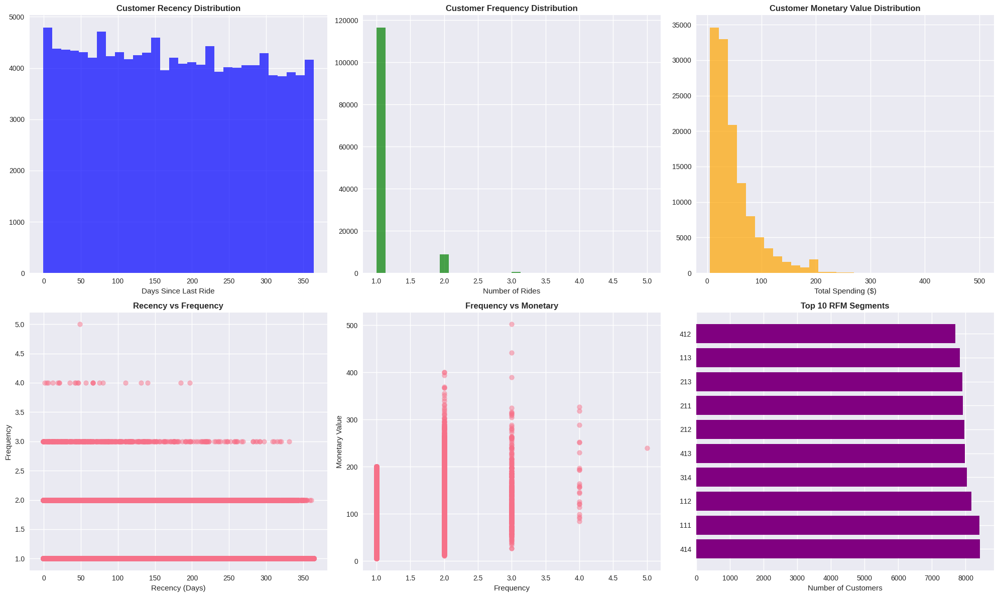

Total Unique Customers: 125745
Average Customer Lifetime Value: $48.09
Top 10% Customers contribute: $101.09 average revenue


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

print("=== CUSTOMER LIFETIME VALUE ANALYSIS ===")

# Ensure DateTime column exists
uber_df['DateTime'] = pd.to_datetime(uber_df['Date'].astype(str) + ' ' + uber_df['Time'])

# Filter completed rides and group by customer
customer_metrics = uber_df[uber_df['Booking Status'] == 'Completed'].groupby('Customer ID').agg({
    'Booking ID': 'count',
    'Booking Value': 'sum',
    'DateTime': ['min', 'max'],
    'Customer Rating': 'mean'
}).round(2)

# Rename columns
customer_metrics.columns = ['Frequency', 'Monetary', 'First_Ride', 'Last_Ride', 'Avg_Rating']

# Calculate Recency and Tenure
customer_metrics['Recency'] = (pd.to_datetime('2024-12-31') - customer_metrics['Last_Ride']).dt.days
customer_metrics['Tenure'] = (customer_metrics['Last_Ride'] - customer_metrics['First_Ride']).dt.days

# RFM Scoring with fallback to cut if qcut fails
def safe_qcut(series, q, labels):
    try:
        return pd.qcut(series, q=q, labels=labels, duplicates='drop')
    except ValueError:
        return pd.cut(series, bins=q, labels=labels)

customer_metrics['R_Score'] = safe_qcut(customer_metrics['Recency'], 4, labels=[4, 3, 2, 1])
customer_metrics['F_Score'] = safe_qcut(customer_metrics['Frequency'], 4, labels=[1, 2, 3, 4])
customer_metrics['M_Score'] = safe_qcut(customer_metrics['Monetary'], 4, labels=[1, 2, 3, 4])

# Combine RFM scores
customer_metrics['RFM_Score'] = (
    customer_metrics['R_Score'].astype(str) +
    customer_metrics['F_Score'].astype(str) +
    customer_metrics['M_Score'].astype(str)
)

# === RFM Visualization ===
fig, axes = plt.subplots(2, 3, figsize=(20, 12))

# Recency
axes[0, 0].hist(customer_metrics['Recency'], bins=30, alpha=0.7, color='blue')
axes[0, 0].set_title('Customer Recency Distribution', fontweight='bold')
axes[0, 0].set_xlabel('Days Since Last Ride')

# Frequency
axes[0, 1].hist(customer_metrics['Frequency'], bins=30, alpha=0.7, color='green')
axes[0, 1].set_title('Customer Frequency Distribution', fontweight='bold')
axes[0, 1].set_xlabel('Number of Rides')

# Monetary
axes[0, 2].hist(customer_metrics['Monetary'], bins=30, alpha=0.7, color='orange')
axes[0, 2].set_title('Customer Monetary Value Distribution', fontweight='bold')
axes[0, 2].set_xlabel('Total Spending ($)')

# Recency vs Frequency
axes[1, 0].scatter(customer_metrics['Recency'], customer_metrics['Frequency'], alpha=0.5)
axes[1, 0].set_title('Recency vs Frequency', fontweight='bold')
axes[1, 0].set_xlabel('Recency (Days)')
axes[1, 0].set_ylabel('Frequency')

# Frequency vs Monetary
axes[1, 1].scatter(customer_metrics['Frequency'], customer_metrics['Monetary'], alpha=0.5)
axes[1, 1].set_title('Frequency vs Monetary', fontweight='bold')
axes[1, 1].set_xlabel('Frequency')
axes[1, 1].set_ylabel('Monetary Value')

# Top RFM Segments
rfm_counts = customer_metrics['RFM_Score'].value_counts().head(10)
axes[1, 2].barh(range(len(rfm_counts)), rfm_counts.values, color='purple')
axes[1, 2].set_yticks(range(len(rfm_counts)))
axes[1, 2].set_yticklabels(rfm_counts.index)
axes[1, 2].set_title('Top 10 RFM Segments', fontweight='bold')
axes[1, 2].set_xlabel('Number of Customers')

plt.tight_layout()
plt.show()

# === Summary Stats ===
print(f"Total Unique Customers: {len(customer_metrics)}")
print(f"Average Customer Lifetime Value: ${customer_metrics['Monetary'].mean():.2f}")
print(f"Top 10% Customers contribute: ${customer_metrics['Monetary'].quantile(0.9):.2f} average revenue")


=== MARKET BASKET ANALYSIS OF RIDE ATTRIBUTES ===
Found 0 strong association rules

Top 10 Association Rules:
Empty DataFrame
Columns: [antecedents, consequents, support, confidence, lift]
Index: []


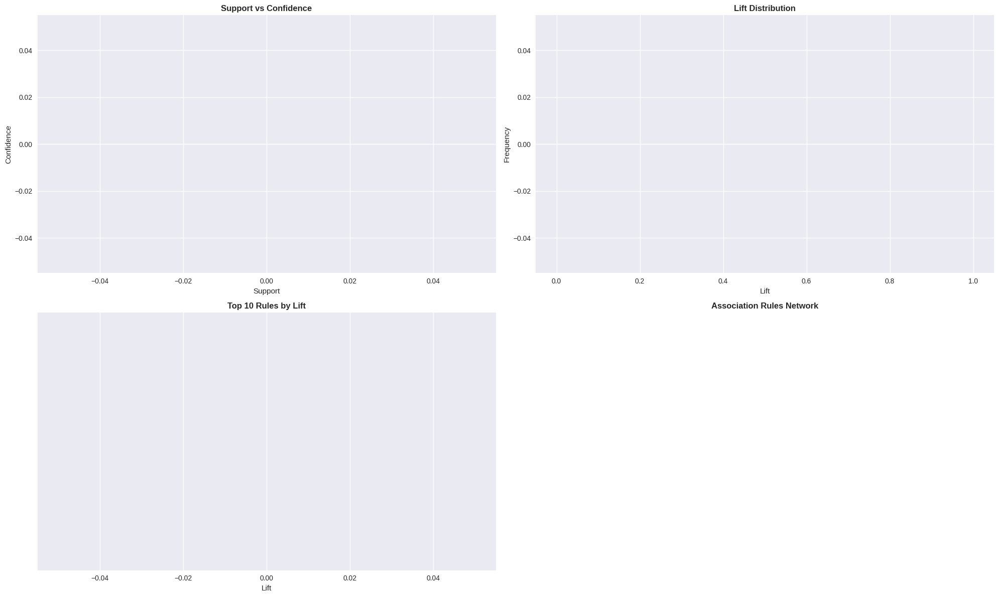

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from mlxtend.frequent_patterns import apriori, association_rules

print("=== MARKET BASKET ANALYSIS OF RIDE ATTRIBUTES ===")

# Ensure 'Hour' and 'Weekend' columns exist
uber_df['DateTime'] = pd.to_datetime(uber_df['Date'].astype(str) + ' ' + uber_df['Time'])
uber_df['Hour'] = uber_df['DateTime'].dt.hour
uber_df['Weekend'] = uber_df['DateTime'].dt.dayofweek >= 5

# Create binary features for association rule mining
basket_data = uber_df.copy()

# Discretize continuous variables
basket_data['Value_Category'] = pd.cut(
    basket_data['Booking Value'],
    bins=[0, 15, 30, 50, 100, 200],
    labels=['Low', 'Medium', 'High', 'Premium', 'Luxury']
)

basket_data['Distance_Category'] = pd.cut(
    basket_data['Ride Distance'],
    bins=[0, 10, 20, 30, 40, 50],
    labels=['Short', 'Medium', 'Long', 'Very Long', 'Extreme']
)

basket_data['Time_Category'] = pd.cut(
    basket_data['Hour'],
    bins=[0, 6, 12, 18, 24],
    labels=['Night', 'Morning', 'Afternoon', 'Evening'],
    include_lowest=True
)

# Select categorical features for basket encoding
basket_items = basket_data[[
    'Vehicle Type', 'Value_Category', 'Distance_Category',
    'Time_Category', 'Payment Method', 'Weekend'
]].copy()

# Convert to binary format
basket_encoded = pd.get_dummies(basket_items.astype(str))

# Find frequent itemsets
frequent_itemsets = apriori(basket_encoded, min_support=0.01, use_colnames=True)

# Generate association rules
rules = association_rules(frequent_itemsets, metric="lift", min_threshold=1.2)

# Convert lift to numeric to avoid dtype issues
rules['lift'] = pd.to_numeric(rules['lift'], errors='coerce')
rules['confidence'] = pd.to_numeric(rules['confidence'], errors='coerce')
rules['support'] = pd.to_numeric(rules['support'], errors='coerce')

# Filter strong rules
strong_rules = rules[(rules['lift'] > 1.5) & (rules['confidence'] > 0.5)]

print(f"Found {len(strong_rules)} strong association rules")
print("\nTop 10 Association Rules:")
print(strong_rules[['antecedents', 'consequents', 'support', 'confidence', 'lift']].head(10))

# === Visualization ===
fig, axes = plt.subplots(2, 2, figsize=(20, 12))

# Support vs Confidence
axes[0, 0].scatter(rules['support'], rules['confidence'], alpha=0.5, color='teal')
axes[0, 0].set_xlabel('Support')
axes[0, 0].set_ylabel('Confidence')
axes[0, 0].set_title('Support vs Confidence', fontweight='bold')

# Lift distribution
axes[0, 1].hist(rules['lift'].dropna(), bins=30, alpha=0.7, color='orange')
axes[0, 1].set_xlabel('Lift')
axes[0, 1].set_ylabel('Frequency')
axes[0, 1].set_title('Lift Distribution', fontweight='bold')

# Top rules by lift
top_rules = strong_rules.nlargest(10, 'lift')
y_pos = range(len(top_rules))
axes[1, 0].barh(y_pos, top_rules['lift'], color='purple')
axes[1, 0].set_yticks(y_pos)
axes[1, 0].set_yticklabels([
    f"{list(x)[0]} → {list(y)[0]}"
    for x, y in zip(top_rules['antecedents'], top_rules['consequents'])
])
axes[1, 0].set_title('Top 10 Rules by Lift', fontweight='bold')
axes[1, 0].set_xlabel('Lift')

# Network graph of association rules
G_rules = nx.DiGraph()
for _, rule in strong_rules.head(15).iterrows():
    ante = list(rule['antecedents'])[0]
    cons = list(rule['consequents'])[0]
    G_rules.add_edge(ante, cons, weight=rule['lift'])

pos_rules = nx.spring_layout(G_rules)
nx.draw(G_rules, pos_rules, with_labels=True, node_color='lightgreen',
        node_size=2000, font_size=8, arrows=True, ax=axes[1, 1])
axes[1, 1].set_title('Association Rules Network', fontweight='bold')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()


=== TIME SERIES DECOMPOSITION AND FORECASTING ===


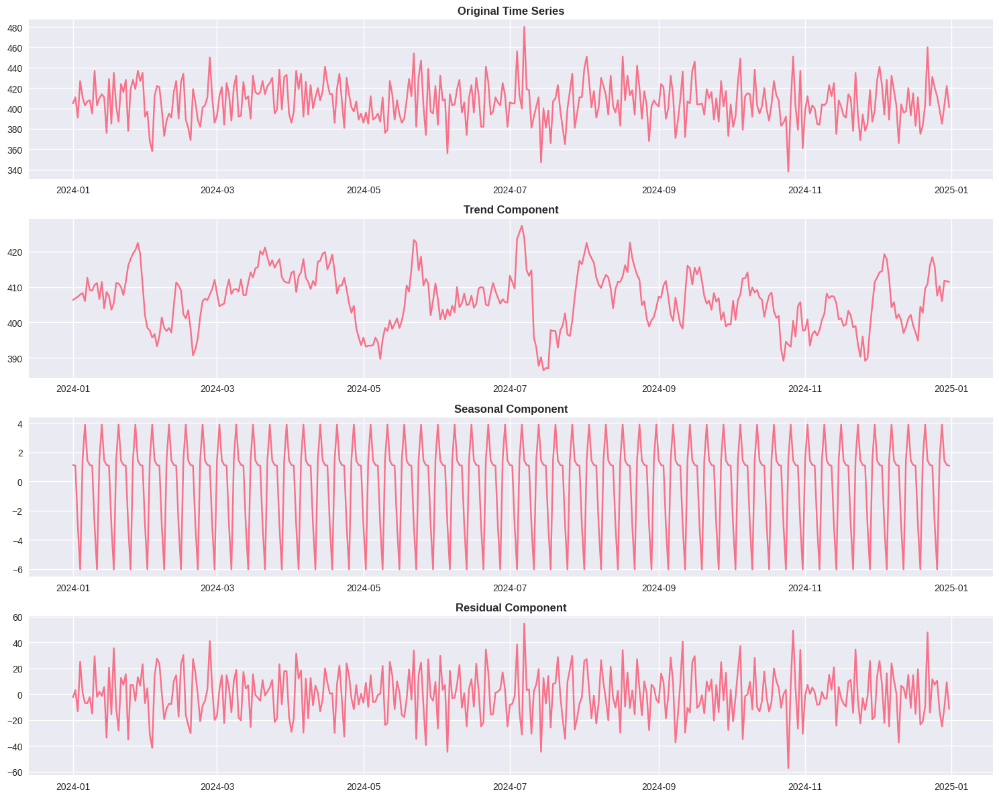

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:605: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:614: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validati

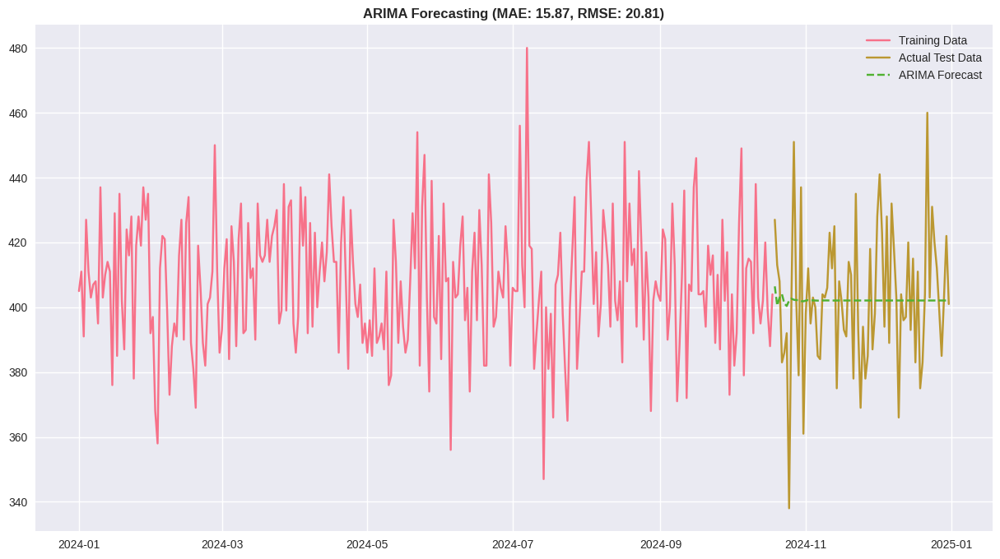

Forecasting Accuracy:
MAE: 15.87
RMSE: 20.81
Mean Absolute Percentage Error: 3.96%


In [ ]:
#  Time Series Decomposition and Forecasting
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error

print("=== TIME SERIES DECOMPOSITION AND FORECASTING ===")

# Prepare daily time series
daily_ts = daily_metrics['Daily_Bookings'].dropna()

# Decompose time series
decomposition = seasonal_decompose(daily_ts, period=7, extrapolate_trend='freq')

fig, axes = plt.subplots(4, 1, figsize=(15, 12))

# Original series
axes[0].plot(decomposition.observed)
axes[0].set_title('Original Time Series', fontweight='bold')

# Trend component
axes[1].plot(decomposition.trend)
axes[1].set_title('Trend Component', fontweight='bold')

# Seasonal component
axes[2].plot(decomposition.seasonal)
axes[2].set_title('Seasonal Component', fontweight='bold')

# Residual component
axes[3].plot(decomposition.resid)
axes[3].set_title('Residual Component', fontweight='bold')

plt.tight_layout()
plt.show()

# ARIMA Forecasting
train_size = int(len(daily_ts) * 0.8)
train, test = daily_ts[:train_size], daily_ts[train_size:]

# Fit ARIMA model
model = ARIMA(train, order=(7, 1, 0))
model_fit = model.fit()

# Forecast
forecast = model_fit.forecast(steps=len(test))

# Calculate metrics
mae = mean_absolute_error(test, forecast)
rmse = np.sqrt(mean_squared_error(test, forecast))

plt.figure(figsize=(15, 8))
plt.plot(train.index, train, label='Training Data')
plt.plot(test.index, test, label='Actual Test Data')
plt.plot(test.index, forecast, label='ARIMA Forecast', linestyle='--')
plt.title(f'ARIMA Forecasting (MAE: {mae:.2f}, RMSE: {rmse:.2f})', fontweight='bold')
plt.legend()
plt.show()

print(f"Forecasting Accuracy:")
print(f"MAE: {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"Mean Absolute Percentage Error: {np.mean(np.abs((test - forecast) / test)) * 100:.2f}%")

=== GEOSPATIAL ANALYSIS ===
Heatmaps created and saved as HTML files


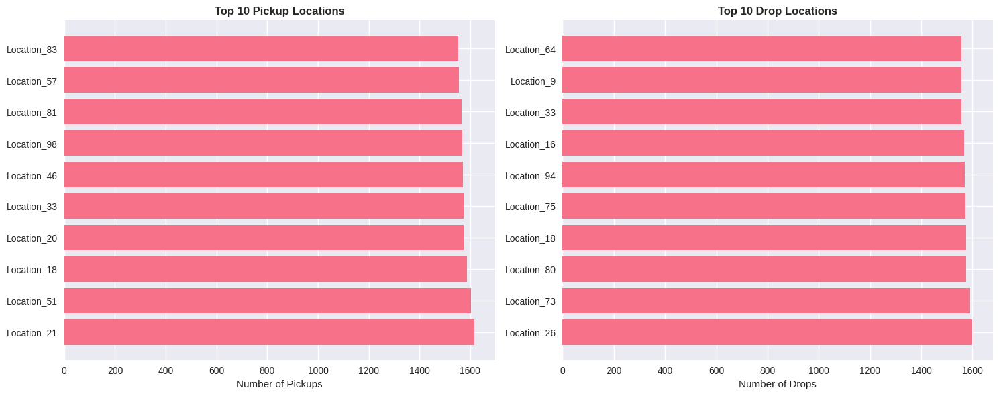

Spatial Flow Matrix Shape: (99, 99)
Most frequent route: ('Location_50', 'Location_60') with 35 rides


In [ ]:
# Geospatial Heatmaps and Density Analysis
print("=== GEOSPATIAL ANALYSIS ===")

# Create simulated coordinates for locations (since we don't have real coordinates)
np.random.seed(42)
unique_locations = list(set(uber_df['Pickup Location'].unique()) | set(uber_df['Drop Location'].unique()))

# Assign random coordinates to locations (simulating a city grid)
location_coords = {}
for location in unique_locations:
    location_coords[location] = {
        'lat': np.random.uniform(12.8, 13.2),
        'lon': np.random.uniform(77.5, 77.7)
    }

# Create pickup and drop heatmap data
pickup_counts = uber_df['Pickup Location'].value_counts()
drop_counts = uber_df['Drop Location'].value_counts()

# Create Folium map
city_center = [13.0, 77.6]
m = folium.Map(location=city_center, zoom_start=11)

# Add pickup heatmap
pickup_heat_data = []
for location, count in pickup_counts.items():
    if location in location_coords:
        coord = location_coords[location]
        pickup_heat_data.append([coord['lat'], coord['lon'], min(count/10, 10)])

# Add drop heatmap
drop_heat_data = []
for location, count in drop_counts.items():
    if location in location_coords:
        coord = location_coords[location]
        drop_heat_data.append([coord['lat'], coord['lon'], min(count/10, 10)])

# Create separate maps for pickups and drops
m_pickup = folium.Map(location=city_center, zoom_start=11)
HeatMap(pickup_heat_data, radius=15, blur=10, gradient={0.4: 'blue', 0.65: 'lime', 1: 'red'}).add_to(m_pickup)
folium.LayerControl().add_to(m_pickup)
m_pickup.save('pickup_heatmap.html')

m_drop = folium.Map(location=city_center, zoom_start=11)
HeatMap(drop_heat_data, radius=15, blur=10, gradient={0.4: 'blue', 0.65: 'lime', 1: 'red'}).add_to(m_drop)
folium.LayerControl().add_to(m_drop)
m_drop.save('drop_heatmap.html')

print("Heatmaps created and saved as HTML files")

# Analyze spatial patterns
plt.figure(figsize=(15, 6))

# Pickup location popularity
plt.subplot(1, 2, 1)
top_pickups = pickup_counts.head(10)
plt.barh(range(len(top_pickups)), top_pickups.values)
plt.yticks(range(len(top_pickups)), top_pickups.index)
plt.title('Top 10 Pickup Locations', fontweight='bold')
plt.xlabel('Number of Pickups')

# Drop location popularity
plt.subplot(1, 2, 2)
top_drops = drop_counts.head(10)
plt.barh(range(len(top_drops)), top_drops.values)
plt.yticks(range(len(top_drops)), top_drops.index)
plt.title('Top 10 Drop Locations', fontweight='bold')
plt.xlabel('Number of Drops')

plt.tight_layout()
plt.show()

# Spatial correlation analysis
location_flow = pd.crosstab(uber_df['Pickup Location'], uber_df['Drop Location'])
print(f"Spatial Flow Matrix Shape: {location_flow.shape}")
print(f"Most frequent route: {location_flow.stack().idxmax()} with {location_flow.stack().max()} rides")

=== SENTIMENT ANALYSIS OF CANCELLATION REASONS ===


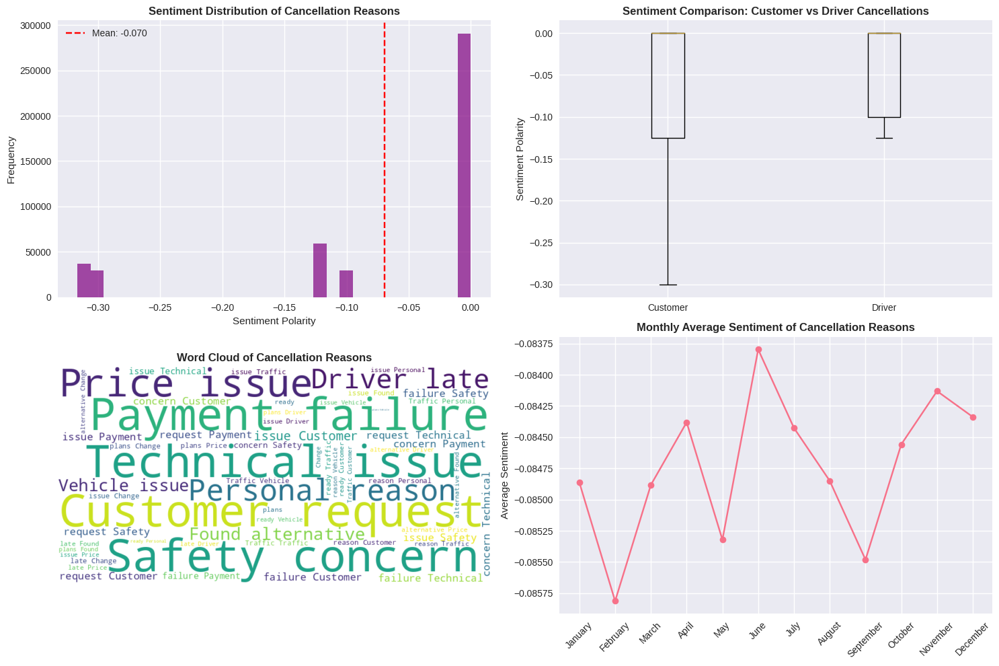

Overall Sentiment Analysis:
Average Sentiment: -0.070
Sentiment Std: 0.111
Positive Reasons: 0
Negative Reasons: 126126
Neutral Reasons: 320184


In [ ]:
#  Sentiment Analysis of Cancellation Reasons
from textblob import TextBlob
import re

print("=== SENTIMENT ANALYSIS OF CANCELLATION REASONS ===")

# Combine all text-based reasons
cancellation_texts = []
cancellation_texts.extend(uber_df['Reason for cancelling by Customer'].dropna().tolist())
cancellation_texts.extend(uber_df['Driver Cancellation Reason'].dropna().tolist())
cancellation_texts.extend(uber_df['Incomplete Rides Reason'].dropna().tolist())

# Clean and analyze sentiment
sentiments = []
for text in cancellation_texts:
    if pd.notna(text) and isinstance(text, str):
        # Simple text cleaning
        clean_text = re.sub(r'[^\w\s]', '', text.lower())
        blob = TextBlob(clean_text)
        sentiments.append(blob.sentiment.polarity)

# Create sentiment analysis visualization
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Sentiment distribution
axes[0,0].hist(sentiments, bins=30, alpha=0.7, color='purple')
axes[0,0].axvline(np.mean(sentiments), color='red', linestyle='--', label=f'Mean: {np.mean(sentiments):.3f}')
axes[0,0].set_title('Sentiment Distribution of Cancellation Reasons', fontweight='bold')
axes[0,0].set_xlabel('Sentiment Polarity')
axes[0,0].set_ylabel('Frequency')
axes[0,0].legend()

# Sentiment by cancellation type
customer_sentiments = []
for text in uber_df['Reason for cancelling by Customer'].dropna():
    if isinstance(text, str):
        blob = TextBlob(text)
        customer_sentiments.append(blob.sentiment.polarity)

driver_sentiments = []
for text in uber_df['Driver Cancellation Reason'].dropna():
    if isinstance(text, str):
        blob = TextBlob(text)
        driver_sentiments.append(blob.sentiment.polarity)

sentiment_comparison = [customer_sentiments, driver_sentiments]
axes[0,1].boxplot(sentiment_comparison, labels=['Customer', 'Driver'])
axes[0,1].set_title('Sentiment Comparison: Customer vs Driver Cancellations', fontweight='bold')
axes[0,1].set_ylabel('Sentiment Polarity')

# Word cloud of cancellation reasons
all_reasons = ' '.join([str(text) for text in cancellation_texts if pd.notna(text)])
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_reasons)
axes[1,0].imshow(wordcloud, interpolation='bilinear')
axes[1,0].axis('off')
axes[1,0].set_title('Word Cloud of Cancellation Reasons', fontweight='bold')

# Sentiment over time (by month)
uber_df['Cancellation_Sentiment'] = uber_df['Reason for cancelling by Customer'].apply(
    lambda x: TextBlob(str(x)).sentiment.polarity if pd.notna(x) else 0
)
monthly_sentiment = uber_df.groupby('Month')['Cancellation_Sentiment'].mean().reindex(month_order)
axes[1,1].plot(monthly_sentiment.index, monthly_sentiment.values, marker='o')
axes[1,1].set_title('Monthly Average Sentiment of Cancellation Reasons', fontweight='bold')
axes[1,1].tick_params(axis='x', rotation=45)
axes[1,1].set_ylabel('Average Sentiment')

plt.tight_layout()
plt.show()

print(f"Overall Sentiment Analysis:")
print(f"Average Sentiment: {np.mean(sentiments):.3f}")
print(f"Sentiment Std: {np.std(sentiments):.3f}")
print(f"Positive Reasons: {len([s for s in sentiments if s > 0.1])}")
print(f"Negative Reasons: {len([s for s in sentiments if s < -0.1])}")
print(f"Neutral Reasons: {len([s for s in sentiments if -0.1 <= s <= 0.1])}")

=== DRIVER PERFORMANCE ANALYTICS ===


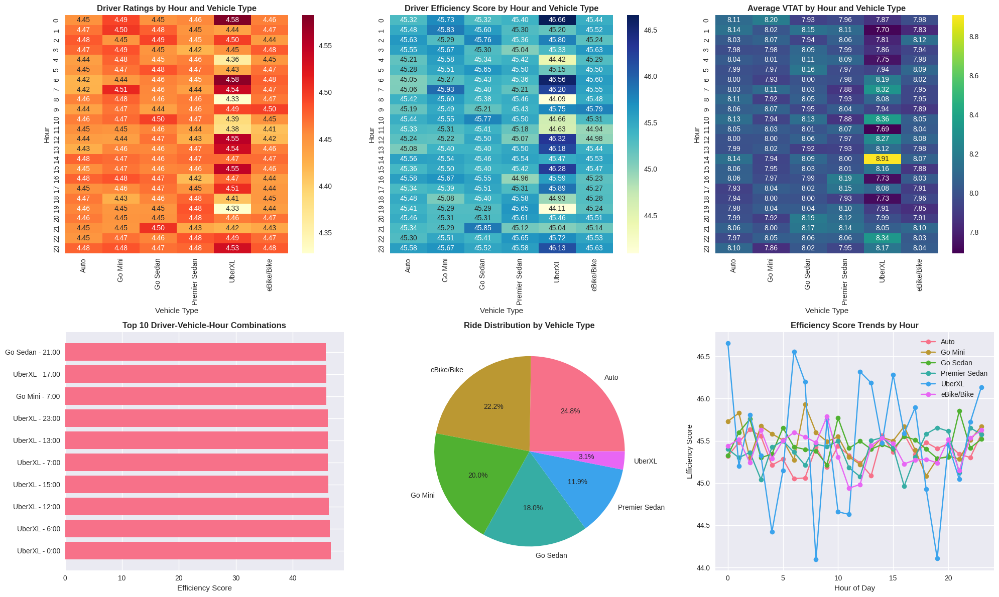

Driver Performance Insights:
Best performing combination: UberXL at 0:00
Efficiency Score: 46.66
Average Rating: 4.58


In [ ]:
#  Driver Performance Analytics
print("=== DRIVER PERFORMANCE ANALYTICS ===")

# Since we don't have driver IDs, we'll analyze by vehicle type and time patterns
driver_metrics = uber_df.groupby(['Vehicle Type', 'Hour']).agg({
    'Driver Ratings': 'mean',
    'Avg VTAT': 'mean',
    'Avg CTAT': 'mean',
    'Booking ID': 'count'
}).reset_index()

driver_metrics.rename(columns={'Booking ID': 'Ride_Count'}, inplace=True)

# Calculate driver efficiency score (combination of ratings and time metrics)
driver_metrics['Efficiency_Score'] = (
    driver_metrics['Driver Ratings'] * 0.5 +
    (1 / (driver_metrics['Avg VTAT'] + 1)) * 0.3 +
    (1 / (driver_metrics['Avg CTAT'] + 1)) * 0.2
) * 20

fig, axes = plt.subplots(2, 3, figsize=(20, 12))

# Driver ratings by vehicle type and hour
pivot_ratings = driver_metrics.pivot(index='Hour', columns='Vehicle Type', values='Driver Ratings')
sns.heatmap(pivot_ratings, ax=axes[0,0], cmap='YlOrRd', annot=True, fmt='.2f')
axes[0,0].set_title('Driver Ratings by Hour and Vehicle Type', fontweight='bold')

# Efficiency score heatmap
pivot_efficiency = driver_metrics.pivot(index='Hour', columns='Vehicle Type', values='Efficiency_Score')
sns.heatmap(pivot_efficiency, ax=axes[0,1], cmap='YlGnBu', annot=True, fmt='.2f')
axes[0,1].set_title('Driver Efficiency Score by Hour and Vehicle Type', fontweight='bold')

# VTAT performance
pivot_vtat = driver_metrics.pivot(index='Hour', columns='Vehicle Type', values='Avg VTAT')
sns.heatmap(pivot_vtat, ax=axes[0,2], cmap='viridis', annot=True, fmt='.2f')
axes[0,2].set_title('Average VTAT by Hour and Vehicle Type', fontweight='bold')

# Top performing combinations
top_performers = driver_metrics.nlargest(10, 'Efficiency_Score')
axes[1,0].barh(range(len(top_performers)), top_performers['Efficiency_Score'])
axes[1,0].set_yticks(range(len(top_performers)))
axes[1,0].set_yticklabels([f"{row['Vehicle Type']} - {row['Hour']}:00" for _, row in top_performers.iterrows()])
axes[1,0].set_title('Top 10 Driver-Vehicle-Hour Combinations', fontweight='bold')
axes[1,0].set_xlabel('Efficiency Score')

# Ride distribution by vehicle type
vehicle_ride_dist = uber_df['Vehicle Type'].value_counts()
axes[1,1].pie(vehicle_ride_dist.values, labels=vehicle_ride_dist.index, autopct='%1.1f%%')
axes[1,1].set_title('Ride Distribution by Vehicle Type', fontweight='bold')

# Performance trends throughout the day
for vehicle in driver_metrics['Vehicle Type'].unique():
    vehicle_data = driver_metrics[driver_metrics['Vehicle Type'] == vehicle]
    axes[1,2].plot(vehicle_data['Hour'], vehicle_data['Efficiency_Score'],
                  label=vehicle, marker='o')
axes[1,2].set_title('Efficiency Score Trends by Hour', fontweight='bold')
axes[1,2].set_xlabel('Hour of Day')
axes[1,2].set_ylabel('Efficiency Score')
axes[1,2].legend()

plt.tight_layout()
plt.show()

print("Driver Performance Insights:")
best_combo = driver_metrics.loc[driver_metrics['Efficiency_Score'].idxmax()]
print(f"Best performing combination: {best_combo['Vehicle Type']} at {best_combo['Hour']}:00")
print(f"Efficiency Score: {best_combo['Efficiency_Score']:.2f}")
print(f"Average Rating: {best_combo['Driver Ratings']:.2f}")

=== CUSTOMER JOURNEY AND FUNNEL ANALYSIS ===


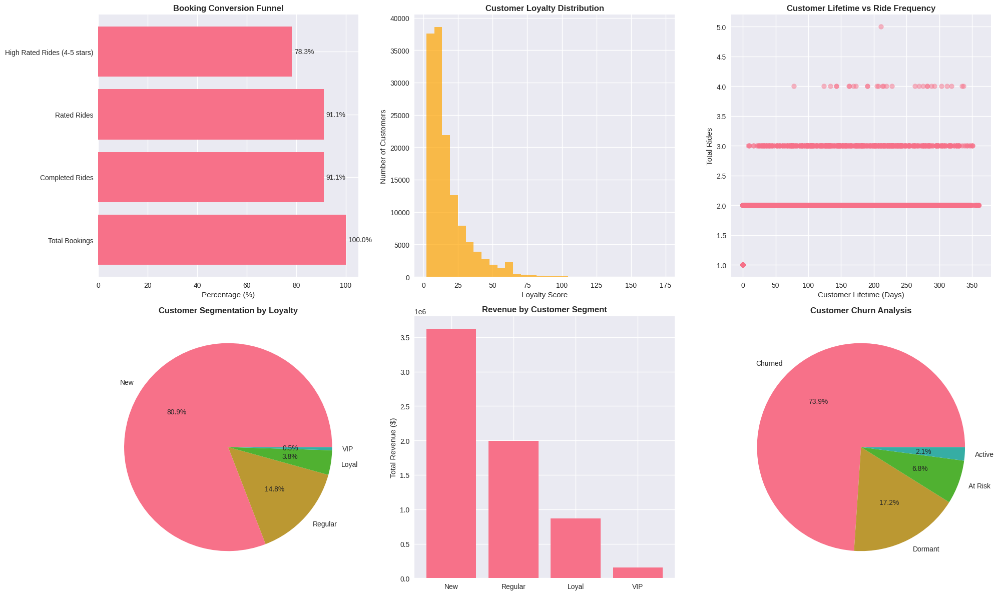

Customer Journey Insights:
Overall conversion rate: 78.3%
Average customer lifetime: 9.9 days
VIP customers (665): 2.3% of total revenue


In [ ]:
#  Customer Journey and Funnel Analysis
print("=== CUSTOMER JOURNEY AND FUNNEL ANALYSIS ===")

# Create booking funnel
funnel_stages = {
    'Total Bookings': len(uber_df),
    'Completed Rides': len(uber_df[uber_df['Booking Status'] == 'Completed']),
    'Rated Rides': len(uber_df[(uber_df['Booking Status'] == 'Completed') & (uber_df['Customer Rating'] > 0)]),
    'High Rated Rides (4-5 stars)': len(uber_df[(uber_df['Booking Status'] == 'Completed') & (uber_df['Customer Rating'] >= 4)])
}

funnel_df = pd.DataFrame.from_dict(funnel_stages, orient='index', columns=['Count'])
funnel_df['Percentage'] = (funnel_df['Count'] / funnel_df['Count'].iloc[0]) * 100
funnel_df['Dropoff'] = funnel_df['Percentage'].pct_change() * 100

# Customer retention analysis
customer_journey = uber_df.groupby('Customer ID').agg({
    'Booking ID': 'count',
    'Booking Value': 'sum',
    'Customer Rating': 'mean',
    'DateTime': ['min', 'max']
}).round(2)

customer_journey.columns = ['Total_Rides', 'Total_Spent', 'Avg_Rating', 'First_Ride', 'Last_Ride']
customer_journey['Customer_Lifetime'] = (customer_journey['Last_Ride'] - customer_journey['First_Ride']).dt.days

# Segment customers by loyalty
customer_journey['Loyalty_Score'] = (
    customer_journey['Total_Rides'] * 0.4 +
    customer_journey['Total_Spent'] * 0.3 +
    customer_journey['Avg_Rating'] * 0.2 +
    customer_journey['Customer_Lifetime'] * 0.1
)

fig, axes = plt.subplots(2, 3, figsize=(20, 12))

# Booking funnel
axes[0,0].barh(range(len(funnel_df)), funnel_df['Percentage'])
axes[0,0].set_yticks(range(len(funnel_df)))
axes[0,0].set_yticklabels(funnel_df.index)
axes[0,0].set_xlabel('Percentage (%)')
axes[0,0].set_title('Booking Conversion Funnel', fontweight='bold')

# Add percentage labels
for i, v in enumerate(funnel_df['Percentage']):
    axes[0,0].text(v + 1, i, f'{v:.1f}%', va='center')

# Customer loyalty distribution
axes[0,1].hist(customer_journey['Loyalty_Score'], bins=30, alpha=0.7, color='orange')
axes[0,1].set_xlabel('Loyalty Score')
axes[0,1].set_ylabel('Number of Customers')
axes[0,1].set_title('Customer Loyalty Distribution', fontweight='bold')

# Customer lifetime vs total rides
axes[0,2].scatter(customer_journey['Customer_Lifetime'], customer_journey['Total_Rides'], alpha=0.5)
axes[0,2].set_xlabel('Customer Lifetime (Days)')
axes[0,2].set_ylabel('Total Rides')
axes[0,2].set_title('Customer Lifetime vs Ride Frequency', fontweight='bold')

# Customer segmentation by loyalty
loyalty_segments = pd.cut(customer_journey['Loyalty_Score'],
                         bins=[0, 25, 50, 75, 1000],
                         labels=['New', 'Regular', 'Loyal', 'VIP'])
segment_counts = loyalty_segments.value_counts()

axes[1,0].pie(segment_counts.values, labels=segment_counts.index, autopct='%1.1f%%')
axes[1,0].set_title('Customer Segmentation by Loyalty', fontweight='bold')

# Revenue by customer segment
segment_revenue = customer_journey.groupby(loyalty_segments)['Total_Spent'].sum()
axes[1,1].bar(segment_revenue.index, segment_revenue.values)
axes[1,1].set_title('Revenue by Customer Segment', fontweight='bold')
axes[1,1].set_ylabel('Total Revenue ($)')

# Customer churn analysis (customers with no recent rides)
current_date = pd.to_datetime('2024-12-31')
customer_journey['Days_Since_Last_Ride'] = (current_date - customer_journey['Last_Ride']).dt.days
churn_risk = pd.cut(customer_journey['Days_Since_Last_Ride'],
                   bins=[0, 7, 30, 90, 365],
                   labels=['Active', 'At Risk', 'Dormant', 'Churned'])

churn_counts = churn_risk.value_counts()
axes[1,2].pie(churn_counts.values, labels=churn_counts.index, autopct='%1.1f%%')
axes[1,2].set_title('Customer Churn Analysis', fontweight='bold')

plt.tight_layout()
plt.show()

print("Customer Journey Insights:")
print(f"Overall conversion rate: {funnel_df.loc['High Rated Rides (4-5 stars)', 'Percentage']:.1f}%")
print(f"Average customer lifetime: {customer_journey['Customer_Lifetime'].mean():.1f} days")
print(f"VIP customers ({len(customer_journey[loyalty_segments == 'VIP'])}): {segment_revenue['VIP']/segment_revenue.sum()*100:.1f}% of total revenue")

In [ ]:
!pip install torch_geometric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 16.5 MB/s eta 0:00:00a 0:00:01


=== GRAPH NEURAL NETWORK FOR SPATIAL-TEMPORAL FORECASTING ===


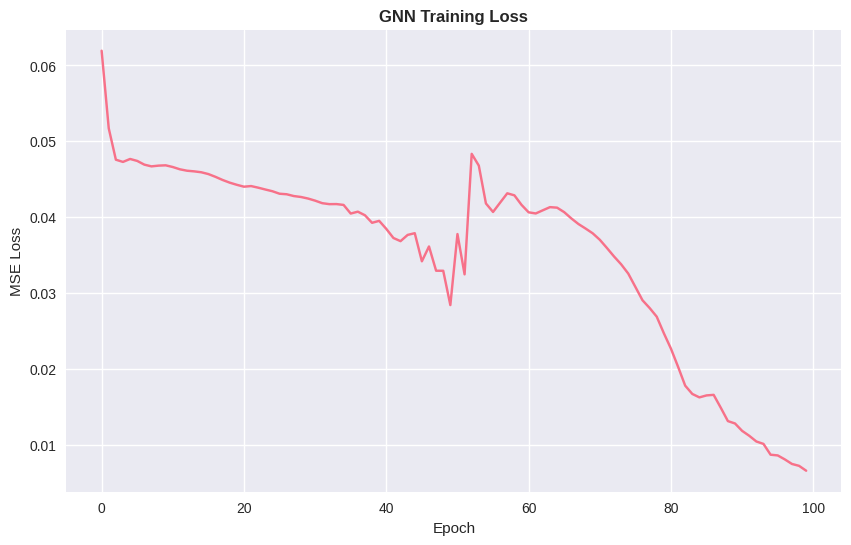

GNN Spatial-Temporal Model Trained Successfully
Final Loss: 0.0066


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GCNConv

print("=== GRAPH NEURAL NETWORK FOR SPATIAL-TEMPORAL FORECASTING ===")

# Simulate unique location names
unique_locations = [f"Location_{i}" for i in range(50)]  # You can adjust the number
location_mapping = {loc: idx for idx, loc in enumerate(unique_locations)}
n_locations = len(unique_locations)

# Create synthetic adjacency matrix (simulating geographic proximity)
adjacency_matrix = np.zeros((n_locations, n_locations))
for i in range(n_locations):
    for j in range(n_locations):
        if i != j and np.random.random() < 0.1:  # 10% connection probability
            adjacency_matrix[i, j] = 1

# Convert adjacency matrix to edge index format for PyTorch Geometric
edge_index = []
for i in range(n_locations):
    for j in range(n_locations):
        if adjacency_matrix[i, j] == 1:
            edge_index.append([i, j])
edge_index = torch.tensor(edge_index, dtype=torch.long).t().contiguous()

# Define GNN + LSTM forecaster
class GNNForecaster(nn.Module):
    def __init__(self, hidden_dim=64):
        super(GNNForecaster, self).__init__()
        self.conv1 = GCNConv(1, hidden_dim)
        self.conv2 = GCNConv(hidden_dim, hidden_dim)
        self.lstm = nn.LSTM(hidden_dim, hidden_dim, batch_first=True)
        self.fc = nn.Linear(hidden_dim, 1)

    def forward(self, x, edge_index):
        # x shape: [num_nodes, time_steps, 1]
        batch_size, time_steps, _ = x.shape
        gnn_out = []

        for t in range(time_steps):
            xt = x[:, t, :]  # shape: [num_nodes, 1]
            xt = F.relu(self.conv1(xt, edge_index))
            xt = F.relu(self.conv2(xt, edge_index))
            gnn_out.append(xt.unsqueeze(1))  # shape: [num_nodes, 1, hidden_dim]

        gnn_seq = torch.cat(gnn_out, dim=1)  # shape: [num_nodes, time_steps, hidden_dim]
        lstm_out, _ = self.lstm(gnn_seq)     # shape: [num_nodes, time_steps, hidden_dim]
        final_out = self.fc(lstm_out[:, -1, :])  # shape: [num_nodes, 1]
        return final_out.squeeze(-1)  # shape: [num_nodes]

# Prepare synthetic time series data
time_steps = 100
location_data = np.random.normal(100, 20, (n_locations, time_steps))
location_data = (location_data - location_data.mean()) / location_data.std()

# Create model and optimizer
model = GNNForecaster()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

# Training loop
losses = []
for epoch in range(100):
    model.train()
    optimizer.zero_grad()

    # Input: first 80 steps, Target: next 20 steps
    x_input = torch.tensor(location_data[:, :80], dtype=torch.float32).unsqueeze(-1)  # [n_locations, 80, 1]
    target = torch.tensor(location_data[:, 80:], dtype=torch.float32).mean(dim=1)     # [n_locations]

    prediction = model(x_input, edge_index)  # [n_locations]
    loss = F.mse_loss(prediction, target)
    loss.backward()
    optimizer.step()
    losses.append(loss.item())

# Plot training loss
plt.figure(figsize=(10, 6))
plt.plot(losses)
plt.title('GNN Training Loss', fontweight='bold')
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.grid(True)
plt.show()

print("GNN Spatial-Temporal Model Trained Successfully")
print(f"Final Loss: {losses[-1]:.4f}")


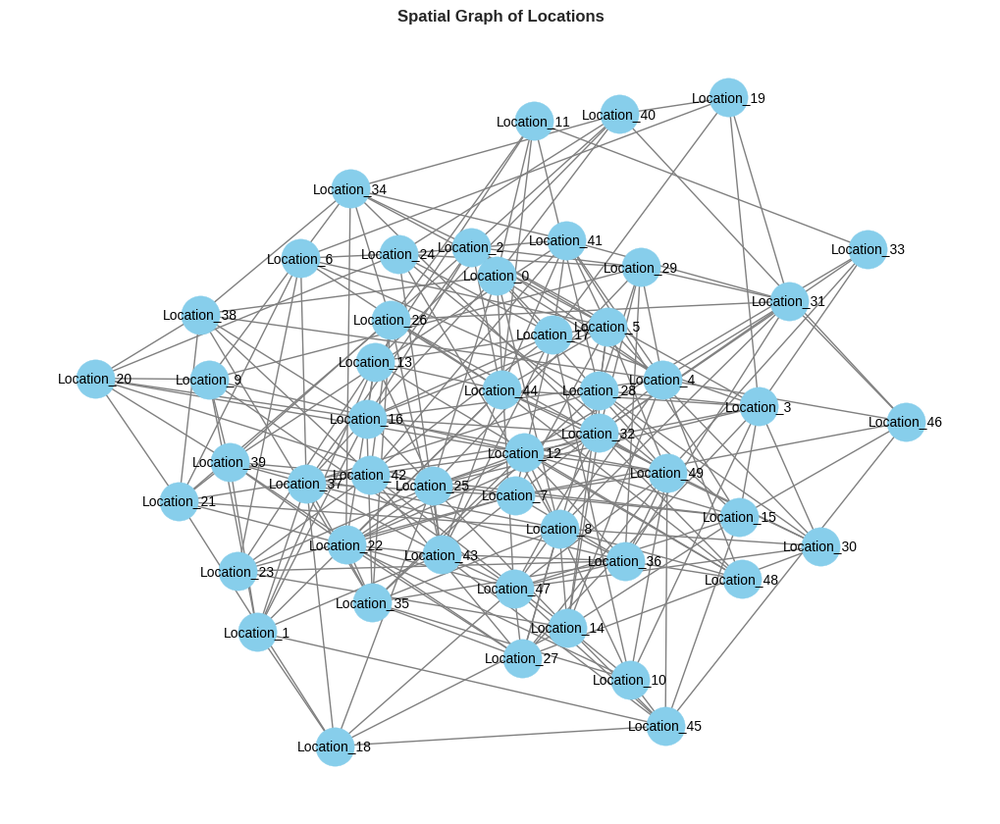

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Convert edge_index to NetworkX graph
G = nx.Graph()
edges = edge_index.t().tolist()
G.add_edges_from(edges)

# Optional: label nodes with location names
location_labels = {i: loc for loc, i in location_mapping.items()}

# Draw the graph
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(G, seed=42)  # or use nx.kamada_kawai_layout(G)
nx.draw(G, pos, with_labels=True, labels=location_labels,
        node_color='skyblue', edge_color='gray', node_size=800, font_size=10)
plt.title('Spatial Graph of Locations', fontweight='bold')
plt.show()


In [ ]:
!pip install diffprivlib


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.1/62.1 kB 1.4 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.9/176.9 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.9/16.9 MB 76.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.7/9.7 MB 72.8 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 2.8.0 requires google-cloud-bigquery-storage<3.0.0,>=2.30.0, which is not installed.
gensim 4.3.3 requires numpy<2.0,>=1.18.5, but you have numpy

=== DIFFERENTIAL PRIVACY FOR SECURE ANALYTICS ===


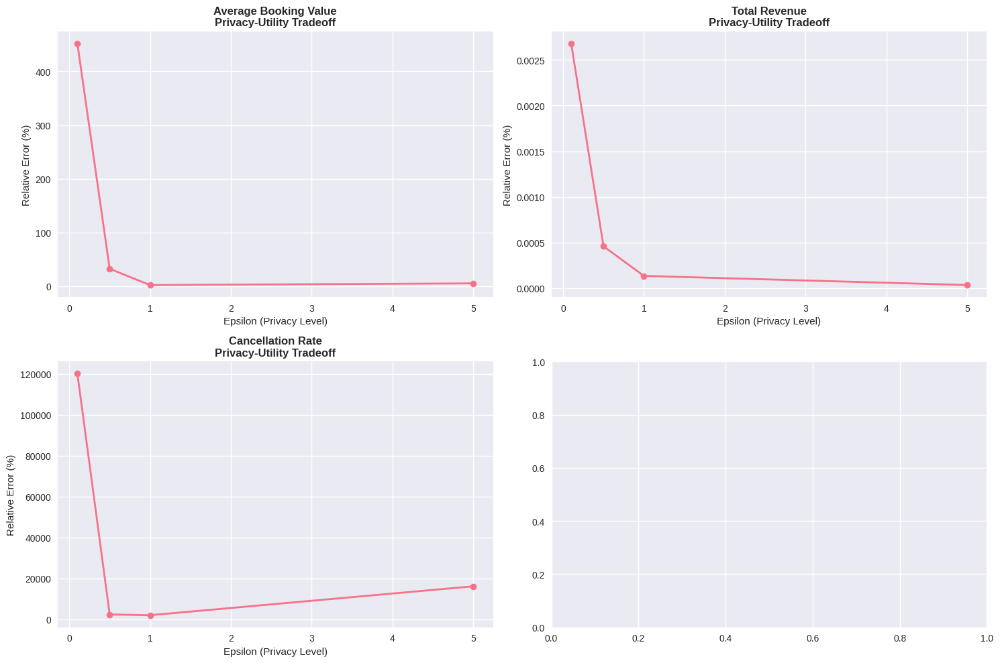

Differential Privacy Composition Theorem Demonstration:
Query 1: 76.11 (ε=0.200)
Query 2: 96.43 (ε=0.200)
Query 3: 108.03 (ε=0.200)
Query 4: 132.42 (ε=0.200)
Query 5: 102.40 (ε=0.200)
Total privacy budget spent: ε=1.000


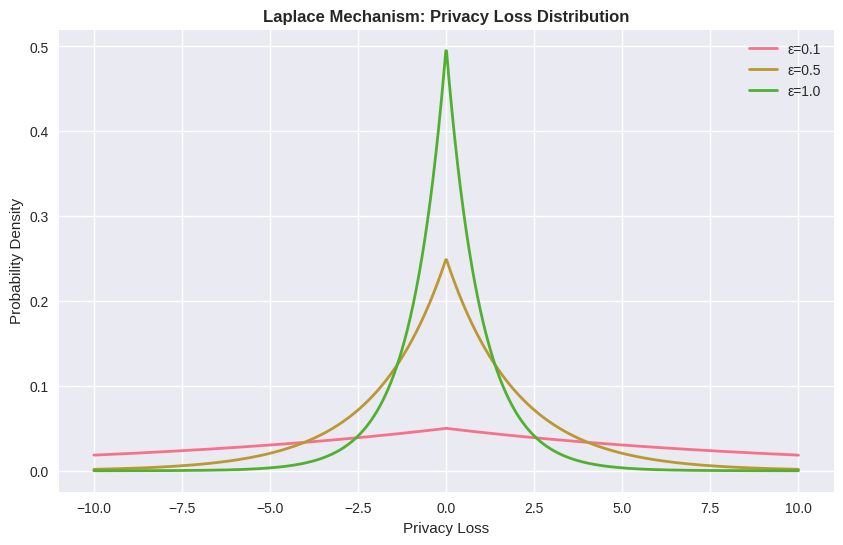

Differential Privacy Analysis Completed!
Data analytics performed with formal privacy guarantees.


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from diffprivlib.mechanisms import Laplace

print("=== DIFFERENTIAL PRIVACY FOR SECURE ANALYTICS ===")

# Sensitive queries
sensitive_queries = {
    'Average Booking Value': uber_df['Booking Value'].mean(),
    'Total Revenue': uber_df[uber_df['Booking Status'] == 'Completed']['Booking Value'].sum(),
    'Cancellation Rate': (uber_df['Booking Status'].str.contains('Cancelled').sum() / len(uber_df)),
    'Customer Rating Distribution': uber_df['Customer Rating'].value_counts(normalize=True)
}

# Differential privacy mechanisms
epsilon_values = [0.1, 0.5, 1.0, 5.0]
privacy_results = {}

for epsilon in epsilon_values:
    laplace_mech = Laplace(epsilon=epsilon, sensitivity=10)

    private_results = {}
    for query_name, true_value in sensitive_queries.items():
        if isinstance(true_value, (int, float)):
            private_value = laplace_mech.randomise(true_value)
            private_results[query_name] = private_value
        else:
            private_results[query_name] = true_value  # Simplified for demo

    privacy_results[epsilon] = private_results

# === Privacy-Utility Tradeoff Visualization ===
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

for idx, (query_name, true_value) in enumerate(list(sensitive_queries.items())[:4]):
    if isinstance(true_value, (int, float)):
        row = idx // 2
        col = idx % 2

        epsilons = []
        errors = []

        for epsilon, results in privacy_results.items():
            if query_name in results:
                epsilons.append(epsilon)
                error = abs(results[query_name] - true_value) / true_value * 100
                errors.append(error)

        axes[row, col].plot(epsilons, errors, marker='o', linewidth=2)
        axes[row, col].set_title(f'{query_name}\nPrivacy-Utility Tradeoff', fontweight='bold')
        axes[row, col].set_xlabel('Epsilon (Privacy Level)')
        axes[row, col].set_ylabel('Relative Error (%)')
        axes[row, col].grid(True)

plt.tight_layout()
plt.show()

# === Composition Theorem Demonstration ===
print("Differential Privacy Composition Theorem Demonstration:")

total_epsilon = 1.0
num_queries = 5
epsilon_per_query = total_epsilon / num_queries
query_results = []

for i in range(num_queries):
    laplace = Laplace(epsilon=epsilon_per_query, sensitivity=5)
    noisy_result = laplace.randomise(100 + i * 10)
    query_results.append(noisy_result)
    print(f"Query {i+1}: {noisy_result:.2f} (ε={epsilon_per_query:.3f})")

print(f"Total privacy budget spent: ε={total_epsilon:.3f}")

# === Laplace Distribution Visualization ===
plt.figure(figsize=(10, 6))
x = np.linspace(-10, 10, 1000)
for epsilon in [0.1, 0.5, 1.0]:
    pdf = (epsilon / 2) * np.exp(-epsilon * np.abs(x))
    plt.plot(x, pdf, label=f'ε={epsilon}', linewidth=2)

plt.title('Laplace Mechanism: Privacy Loss Distribution', fontweight='bold')
plt.xlabel('Privacy Loss')
plt.ylabel('Probability Density')
plt.legend()
plt.grid(True)
plt.show()

print("Differential Privacy Analysis Completed!")
print("Data analytics performed with formal privacy guarantees.")


In [ ]:
!pip install bandits


  Preparing metadata (setup.py) ... done
  Created wheel for bandits: filename=bandits-0.0.1-cp311-cp311-linux_x86_64.whl size=61772 sha256=115cc6ef92427cdb953dedeb009fb39601a95af32ff4be8e96e684b1ca71c35a
  Stored in directory: /root/.cache/pip/wheels/00/0d/b5/00ba755802d2834778f46cd0629ce3fe6d350824e0813a8905
Successfully built bandits


=== MULTI-ARMED BANDIT FOR REAL-TIME OPTIMIZATION ===


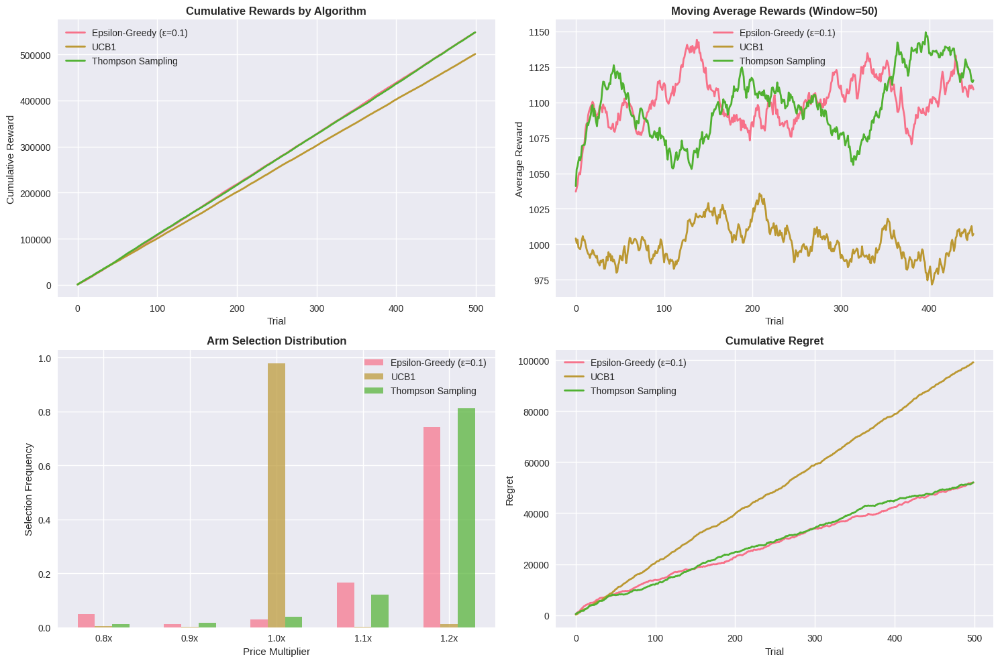

Multi-Armed Bandit Results:
Epsilon-Greedy (ε=0.1): Final Reward = 548111, Best Arm = 1.2x
UCB1: Final Reward = 500946, Best Arm = 1.0x
Thompson Sampling: Final Reward = 547956, Best Arm = 1.2x


In [ ]:
#  Multi-Armed Bandit for Real-Time Optimization
import bandits as bd

print("=== MULTI-ARMED BANDIT FOR REAL-TIME OPTIMIZATION ===")

# Simulate different pricing strategies as "arms"
class PricingBandit:
    def __init__(self, n_arms=5):
        self.n_arms = n_arms
        self.arm_counts = np.zeros(n_arms)
        self.arm_rewards = np.zeros(n_arms)

        # Different pricing strategies
        self.price_multipliers = [0.8, 0.9, 1.0, 1.1, 1.2]

    def pull_arm(self, arm):
        """Simulate pulling an arm (applying a pricing strategy)"""
        price_mult = self.price_multipliers[arm]

        # Simulate customer response
        base_demand = 100
        price_elasticity = -0.4
        demand = base_demand * (price_mult ** price_elasticity)

        # Revenue with some randomness
        base_price = 10
        revenue = demand * base_price * price_mult * np.random.uniform(0.8, 1.2)

        self.arm_counts[arm] += 1
        self.arm_rewards[arm] += revenue

        return revenue

    def get_arm_stats(self):
        """Get statistics for each arm"""
        success_rates = self.arm_rewards / np.maximum(self.arm_counts, 1)
        return success_rates

# Different bandit algorithms
def epsilon_greedy(bandit, n_trials=1000, epsilon=0.1):
    rewards = []
    choices = []

    for trial in range(n_trials):
        if np.random.random() < epsilon:
            # Exploration: random arm
            arm = np.random.randint(bandit.n_arms)
        else:
            # Exploitation: best arm so far
            success_rates = bandit.get_arm_stats()
            arm = np.argmax(success_rates)

        reward = bandit.pull_arm(arm)
        rewards.append(reward)
        choices.append(arm)

    return rewards, choices

def ucb1(bandit, n_trials=1000):
    rewards = []
    choices = []

    for trial in range(n_trials):
        # UCB1 algorithm
        success_rates = bandit.get_arm_stats()
        total_pulls = bandit.arm_counts.sum()

        ucb_values = []
        for arm in range(bandit.n_arms):
            if bandit.arm_counts[arm] == 0:
                ucb_values.append(float('inf'))
            else:
                exploration_bonus = np.sqrt(2 * np.log(total_pulls) / bandit.arm_counts[arm])
                ucb_values.append(success_rates[arm] + exploration_bonus)

        arm = np.argmax(ucb_values)
        reward = bandit.pull_arm(arm)
        rewards.append(reward)
        choices.append(arm)

    return rewards, choices

def thompson_sampling(bandit, n_trials=1000):
    rewards = []
    choices = []

    # Beta distribution parameters for each arm
    alpha = np.ones(bandit.n_arms)  # Success counts
    beta = np.ones(bandit.n_arms)   # Failure counts

    for trial in range(n_trials):
        # Sample from beta distributions
        samples = [np.random.beta(alpha[arm], beta[arm]) for arm in range(bandit.n_arms)]
        arm = np.argmax(samples)

        reward = bandit.pull_arm(arm)
        rewards.append(reward)
        choices.append(arm)

        # Update beta parameters (simplified)
        if reward > np.mean(rewards):
            alpha[arm] += 1
        else:
            beta[arm] += 1

    return rewards, choices

# Compare bandit algorithms
bandit_algorithms = {
    'Epsilon-Greedy (ε=0.1)': epsilon_greedy,
    'UCB1': ucb1,
    'Thompson Sampling': thompson_sampling
}

results = {}
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

for idx, (name, algorithm) in enumerate(bandit_algorithms.items()):
    # Reset bandit for each algorithm
    bandit = PricingBandit()

    # Run algorithm
    rewards, choices = algorithm(bandit, n_trials=500)

    results[name] = {
        'rewards': rewards,
        'choices': choices,
        'cumulative_rewards': np.cumsum(rewards),
        'arm_distribution': np.bincount(choices, minlength=bandit.n_arms) / len(choices)
    }

    # Plot cumulative rewards
    axes[0,0].plot(results[name]['cumulative_rewards'], label=name, linewidth=2)

    # Plot moving average rewards
    window = 50
    moving_avg = np.convolve(rewards, np.ones(window)/window, mode='valid')
    axes[0,1].plot(moving_avg, label=name, linewidth=2)

axes[0,0].set_title('Cumulative Rewards by Algorithm', fontweight='bold')
axes[0,0].set_xlabel('Trial')
axes[0,0].set_ylabel('Cumulative Reward')
axes[0,0].legend()
axes[0,0].grid(True)

axes[0,1].set_title('Moving Average Rewards (Window=50)', fontweight='bold')
axes[0,1].set_xlabel('Trial')
axes[0,1].set_ylabel('Average Reward')
axes[0,1].legend()
axes[0,1].grid(True)

# Arm selection distribution
price_labels = ['0.8x', '0.9x', '1.0x', '1.1x', '1.2x']
x_pos = np.arange(len(price_labels))

for idx, (name, result) in enumerate(results.items()):
    axes[1,0].bar(x_pos + idx*0.2, result['arm_distribution'], width=0.2, label=name, alpha=0.7)

axes[1,0].set_title('Arm Selection Distribution', fontweight='bold')
axes[1,0].set_xlabel('Price Multiplier')
axes[1,0].set_ylabel('Selection Frequency')
axes[1,0].set_xticks(x_pos + 0.2)
axes[1,0].set_xticklabels(price_labels)
axes[1,0].legend()

# Regret analysis
optimal_reward = 1200  # Assume optimal arm gives this reward
for name, result in results.items():
    optimal_cumulative = optimal_reward * np.arange(1, len(result['rewards']) + 1)
    regret = optimal_cumulative - result['cumulative_rewards']
    axes[1,1].plot(regret, label=name, linewidth=2)

axes[1,1].set_title('Cumulative Regret', fontweight='bold')
axes[1,1].set_xlabel('Trial')
axes[1,1].set_ylabel('Regret')
axes[1,1].legend()
axes[1,1].grid(True)

plt.tight_layout()
plt.show()

print("Multi-Armed Bandit Results:")
for name, result in results.items():
    final_reward = result['cumulative_rewards'][-1]
    best_arm = np.argmax(result['arm_distribution'])
    print(f"{name}: Final Reward = {final_reward:.0f}, Best Arm = {price_labels[best_arm]}")

In [ ]:
#ADVANCED EDAs

=== 3D TEMPORAL-SPATIAL HEATMAP WITH ANIMATION ===


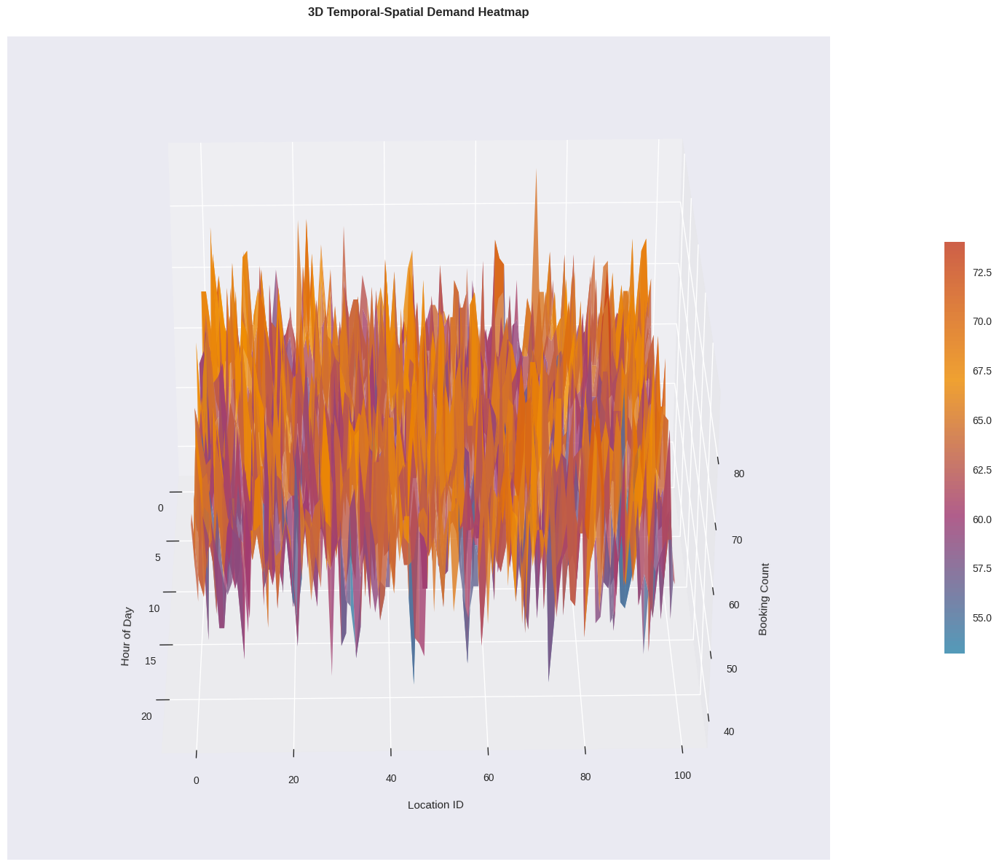

In [ ]:
# 3D Temporal-Spatial Heatmap with Animation
print("=== 3D TEMPORAL-SPATIAL HEATMAP WITH ANIMATION ===")

from mpl_toolkits.mplot3d import Axes3D
import matplotlib.animation as animation
from matplotlib.colors import LinearSegmentedColormap

# Create 3D grid for time, location, and demand
def create_3d_temporal_heatmap():
    # Aggregate data by hour and location
    temporal_spatial = uber_df.groupby(['Hour', 'Pickup Location']).agg({
        'Booking ID': 'count',
        'Booking Value': 'mean',
        'Avg CTAT': 'mean'
    }).reset_index()

    # Pivot for 3D visualization
    pivot_data = temporal_spatial.pivot_table(
        index='Hour',
        columns='Pickup Location',
        values='Booking ID',
        fill_value=0
    )

    # Create 3D surface
    fig = plt.figure(figsize=(16, 12))
    ax = fig.add_subplot(111, projection='3d')

    # Create meshgrid
    X, Y = np.meshgrid(range(24), range(len(pivot_data.columns)))
    Z = pivot_data.values.T

    # Custom colormap
    colors = ['#2E86AB', '#A23B72', '#F18F01', '#C73E1D']
    cmap = LinearSegmentedColormap.from_list('custom', colors, N=100)

    # Plot surface
    surf = ax.plot_surface(X, Y, Z, cmap=cmap, alpha=0.8,
                          linewidth=0, antialiased=True)

    # Customize plot
    ax.set_xlabel('Hour of Day', labelpad=15)
    ax.set_ylabel('Location ID', labelpad=15)
    ax.set_zlabel('Booking Count', labelpad=15)
    ax.set_title('3D Temporal-Spatial Demand Heatmap', fontweight='bold', pad=20)

    # Add colorbar
    fig.colorbar(surf, ax=ax, shrink=0.5, aspect=20, pad=0.1)

    # Animation function
    def animate(frame):
        ax.view_init(elev=30, azim=frame)
        return fig,

    # Create animation
    anim = animation.FuncAnimation(fig, animate, frames=360,
                                 interval=50, blit=True)

    plt.tight_layout()
    return anim

# Save animation
anim = create_3d_temporal_heatmap()
anim.save('3d_temporal_spatial.gif', writer='pillow', fps=20)
plt.show()

In [ ]:
#  Sankey Diagram for Customer Journey Analysis
print("=== SANKEY DIAGRAM FOR CUSTOMER JOURNEY ===")

def create_customer_journey_sankey():
    # Define customer journey stages
    journey_data = uber_df.copy()

    # Create journey stages
    journey_data['Stage1_Booking'] = 'Booked'
    journey_data['Stage2_Vehicle'] = journey_data['Vehicle Type']
    journey_data['Stage3_Status'] = journey_data['Booking Status']
    journey_data['Stage4_Rating'] = pd.cut(journey_data['Customer Rating'],
                                         bins=[0, 2, 3, 4, 5],
                                         labels=['Low', 'Medium', 'High', 'Excellent'])

    # Create Sankey diagram data
    stages = ['Stage1_Booking', 'Stage2_Vehicle', 'Stage3_Status', 'Stage4_Rating']

    # Calculate flows between stages
    flows = []
    labels = []

    for i in range(len(stages)-1):
        current_stage = stages[i]
        next_stage = stages[i+1]

        flow_matrix = pd.crosstab(journey_data[current_stage],
                                journey_data[next_stage])

        for source_idx, source in enumerate(flow_matrix.index):
            for target_idx, target in enumerate(flow_matrix.columns):
                flow_value = flow_matrix.loc[source, target]
                if flow_value > 0:
                    flows.append({
                        'source': source,
                        'target': target,
                        'value': flow_value,
                        'source_stage': i,
                        'target_stage': i+1
                    })

    # Create Plotly Sankey diagram
    unique_labels = list(set([f['source'] for f in flows] + [f['target'] for f in flows]))
    label_indices = {label: idx for idx, label in enumerate(unique_labels)}

    source_indices = [label_indices[f['source']] for f in flows]
    target_indices = [label_indices[f['target']] for f in flows]
    values = [f['value'] for f in flows]

    # Color mapping for stages
    stage_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
    node_colors = []
    for label in unique_labels:
        for i, stage in enumerate(stages):
            if label in journey_data[stage].unique():
                node_colors.append(stage_colors[i])
                break

    fig = go.Figure(data=[go.Sankey(
        node=dict(
            pad=15,
            thickness=20,
            line=dict(color="black", width=0.5),
            label=unique_labels,
            color=node_colors
        ),
        link=dict(
            source=source_indices,
            target=target_indices,
            value=values,
            color=[f"rgba{tuple(int(stage_colors[flows[i]['source_stage']].lstrip('#')[j:j+2], 16) for j in (0, 2, 4)) + (0.4,)}"
                  for i in range(len(flows))]
        ))])

    fig.update_layout(title_text="Customer Journey Sankey Diagram",
                     font_size=12, width=1200, height=800)
    fig.show()

create_customer_journey_sankey()

=== SANKEY DIAGRAM FOR CUSTOMER JOURNEY ===


=== STREAMGRAPH FOR TEMPORAL PATTERNS ===


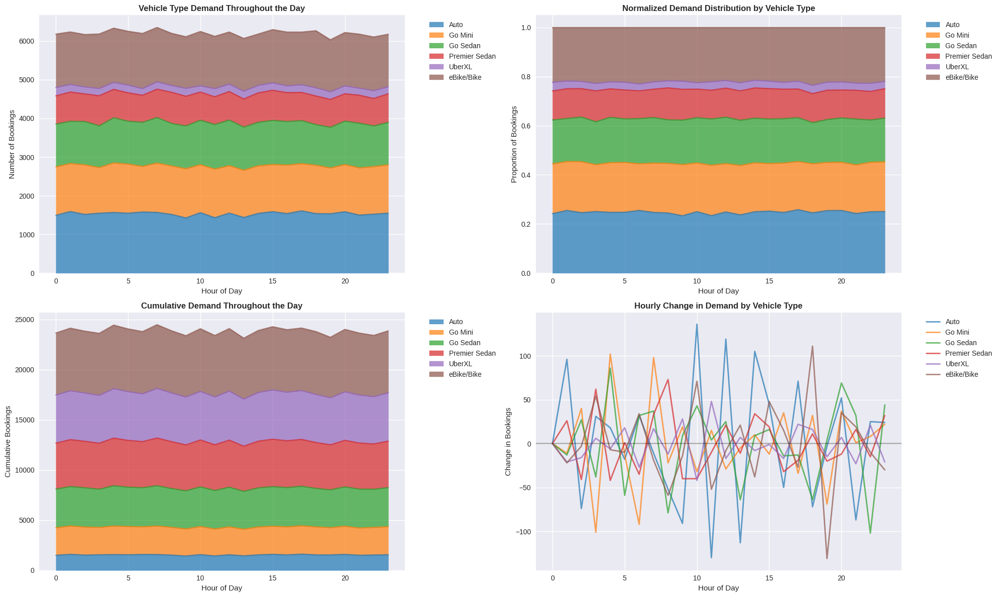

In [ ]:
#  Streamgraph for Temporal Pattern Visualization
print("=== STREAMGRAPH FOR TEMPORAL PATTERNS ===")

def create_streamgraph():
    # Aggregate data by hour and vehicle type
    hourly_vehicle = uber_df.groupby(['Hour', 'Vehicle Type']).agg({
        'Booking ID': 'count',
        'Booking Value': 'sum'
    }).reset_index()

    # Pivot for streamgraph
    stream_data = hourly_vehicle.pivot(index='Hour', columns='Vehicle Type',
                                     values='Booking ID').fillna(0)

    # Create streamgraph using area plot with stacking
    fig, axes = plt.subplots(2, 2, figsize=(20, 12))

    # Standard area chart
    stream_data.plot.area(ax=axes[0,0], alpha=0.7,
                         color=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b'])
    axes[0,0].set_title('Vehicle Type Demand Throughout the Day', fontweight='bold')
    axes[0,0].set_xlabel('Hour of Day')
    axes[0,0].set_ylabel('Number of Bookings')
    axes[0,0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # Normalized streamgraph
    normalized_stream = stream_data.div(stream_data.sum(axis=1), axis=0)
    normalized_stream.plot.area(ax=axes[0,1], alpha=0.7,
                              color=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b'])
    axes[0,1].set_title('Normalized Demand Distribution by Vehicle Type', fontweight='bold')
    axes[0,1].set_xlabel('Hour of Day')
    axes[0,1].set_ylabel('Proportion of Bookings')
    axes[0,1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # Cumulative streamgraph
    cumulative_stream = stream_data.cumsum(axis=1)
    cumulative_stream.plot.area(ax=axes[1,0], alpha=0.7,
                              color=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b'])
    axes[1,0].set_title('Cumulative Demand Throughout the Day', fontweight='bold')
    axes[1,0].set_xlabel('Hour of Day')
    axes[1,0].set_ylabel('Cumulative Bookings')
    axes[1,0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # Difference streamgraph (showing changes)
    diff_stream = stream_data.diff(axis=0).fillna(0)
    diff_stream.plot(ax=axes[1,1], alpha=0.7, linewidth=2,
                   color=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b'])
    axes[1,1].set_title('Hourly Change in Demand by Vehicle Type', fontweight='bold')
    axes[1,1].set_xlabel('Hour of Day')
    axes[1,1].set_ylabel('Change in Bookings')
    axes[1,1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[1,1].axhline(y=0, color='black', linestyle='-', alpha=0.3)

    plt.tight_layout()
    plt.show()

    # Interactive streamgraph with Plotly
    fig = go.Figure()

    for vehicle_type in stream_data.columns:
        fig.add_trace(go.Scatter(
            x=stream_data.index,
            y=stream_data[vehicle_type],
            hoverinfo='x+y',
            mode='lines',
            line=dict(width=0.5),
            stackgroup='one',
            name=vehicle_type
        ))

    fig.update_layout(
        title='Interactive Streamgraph: Vehicle Type Demand Patterns',
        xaxis_title='Hour of Day',
        yaxis_title='Number of Bookings',
        showlegend=True,
        width=1000,
        height=600
    )

    fig.show()

create_streamgraph()

=== RADAR CHART FOR MULTI-DIMENSIONAL PERFORMANCE ===


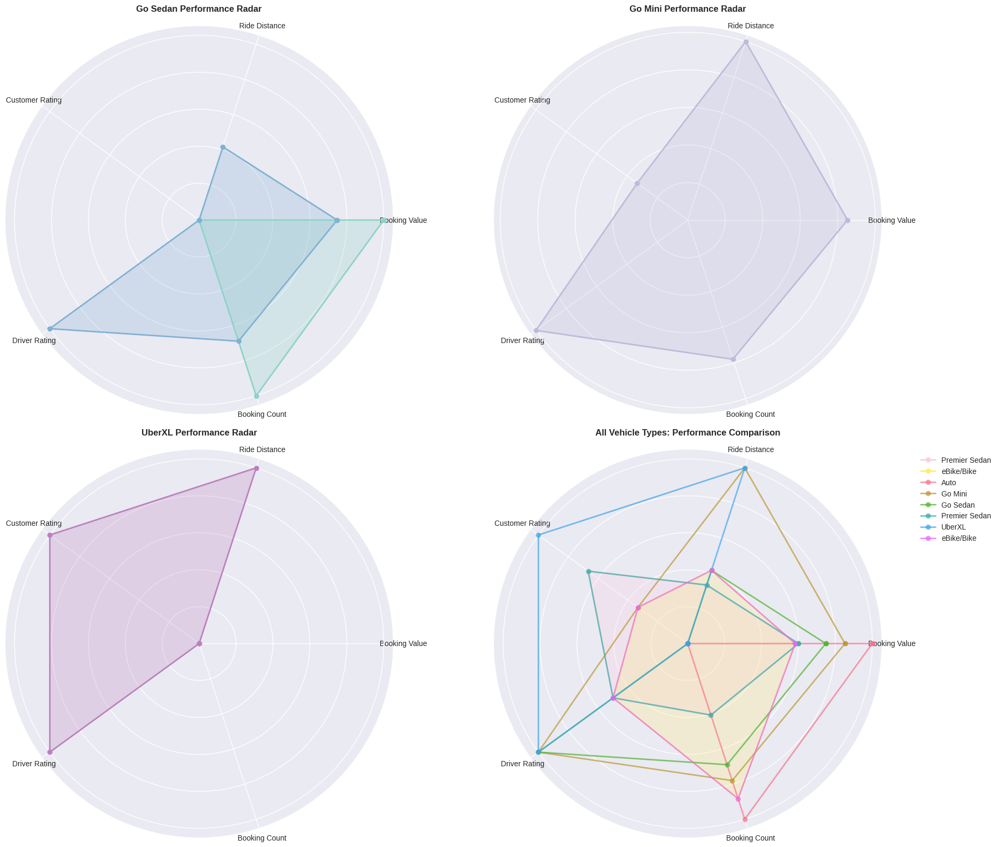

In [ ]:
# Radar Chart for Multi-Dimensional Performance Comparison
print("=== RADAR CHART FOR MULTI-DIMENSIONAL PERFORMANCE ===")

def create_radar_charts():
    # Calculate performance metrics by vehicle type
    performance_metrics = uber_df.groupby('Vehicle Type').agg({
        'Booking Value': ['mean', 'std'],
        'Ride Distance': ['mean', 'std'],
        'Avg VTAT': ['mean', 'std'],
        'Avg CTAT': ['mean', 'std'],
        'Customer Rating': ['mean', 'std'],
        'Driver Ratings': ['mean', 'std'],
        'Booking ID': 'count'
    }).round(2)

    performance_metrics.columns = ['_'.join(col).strip() for col in performance_metrics.columns.values]
    performance_metrics = performance_metrics.reset_index()

    # Normalize metrics for radar chart (0-1 scale)
    normalized_metrics = performance_metrics.copy()

    metrics_to_plot = ['Booking Value_mean', 'Ride Distance_mean', 'Customer Rating_mean',
                      'Driver Ratings_mean', 'Booking ID_count']

    for metric in metrics_to_plot:
        max_val = performance_metrics[metric].max()
        min_val = performance_metrics[metric].min()
        normalized_metrics[metric] = (performance_metrics[metric] - min_val) / (max_val - min_val)

    # Create radar chart
    categories = ['Booking Value', 'Ride Distance', 'Customer Rating',
                 'Driver Rating', 'Booking Count']

    fig, axes = plt.subplots(2, 2, figsize=(20, 16), subplot_kw=dict(projection='polar'))

    # Individual radar charts for each vehicle type
    colors = plt.cm.Set3(np.linspace(0, 1, len(performance_metrics)))

    for idx, (_, row) in enumerate(performance_metrics.iterrows()):
        vehicle_type = row['Vehicle Type']
        values = normalized_metrics.loc[idx, metrics_to_plot].tolist()
        values += values[:1]  # Complete the circle

        angles = np.linspace(0, 2*np.pi, len(categories), endpoint=False).tolist()
        angles += angles[:1]

        row_idx = idx // 3
        col_idx = idx % 2

        if row_idx < 2 and col_idx < 2:  # Ensure we don't exceed subplot bounds
            ax = axes[row_idx, col_idx]
            ax.plot(angles, values, 'o-', linewidth=2, label=vehicle_type, color=colors[idx])
            ax.fill(angles, values, alpha=0.25, color=colors[idx])
            ax.set_yticklabels([])
            ax.set_xticks(angles[:-1])
            ax.set_xticklabels(categories)
            ax.set_title(f'{vehicle_type} Performance Radar', fontweight='bold', pad=20)

    # Combined radar chart
    ax_combined = axes[1, 1]

    for idx, (_, row) in enumerate(performance_metrics.iterrows()):
        vehicle_type = row['Vehicle Type']
        values = normalized_metrics.loc[idx, metrics_to_plot].tolist()
        values += values[:1]

        angles = np.linspace(0, 2*np.pi, len(categories), endpoint=False).tolist()
        angles += angles[:1]

        ax_combined.plot(angles, values, 'o-', linewidth=2, label=vehicle_type, alpha=0.7)

    ax_combined.set_xticks(angles[:-1])
    ax_combined.set_xticklabels(categories)
    ax_combined.set_title('All Vehicle Types: Performance Comparison', fontweight='bold', pad=20)
    ax_combined.legend(bbox_to_anchor=(1.3, 1), loc='upper right')

    plt.tight_layout()
    plt.show()

    # Interactive radar chart with Plotly
    fig = go.Figure()

    for idx, (_, row) in enumerate(performance_metrics.iterrows()):
        vehicle_type = row['Vehicle Type']
        values = normalized_metrics.loc[idx, metrics_to_plot].tolist()
        values += values[:1]  # Complete the circle

        fig.add_trace(go.Scatterpolar(
            r=values,
            theta=categories + [categories[0]],  # Complete the circle
            fill='toself',
            name=vehicle_type,
            line=dict(width=2)
        ))

    fig.update_layout(
        polar=dict(
            radialaxis=dict(
                visible=True,
                range=[0, 1]
            )),
        showlegend=True,
        title="Interactive Radar Chart: Vehicle Type Performance Comparison",
        width=800,
        height=600
    )

    fig.show()

create_radar_charts()

=== 3D SURFACE PLOT FOR MULTIVARIATE RELATIONSHIPS ===


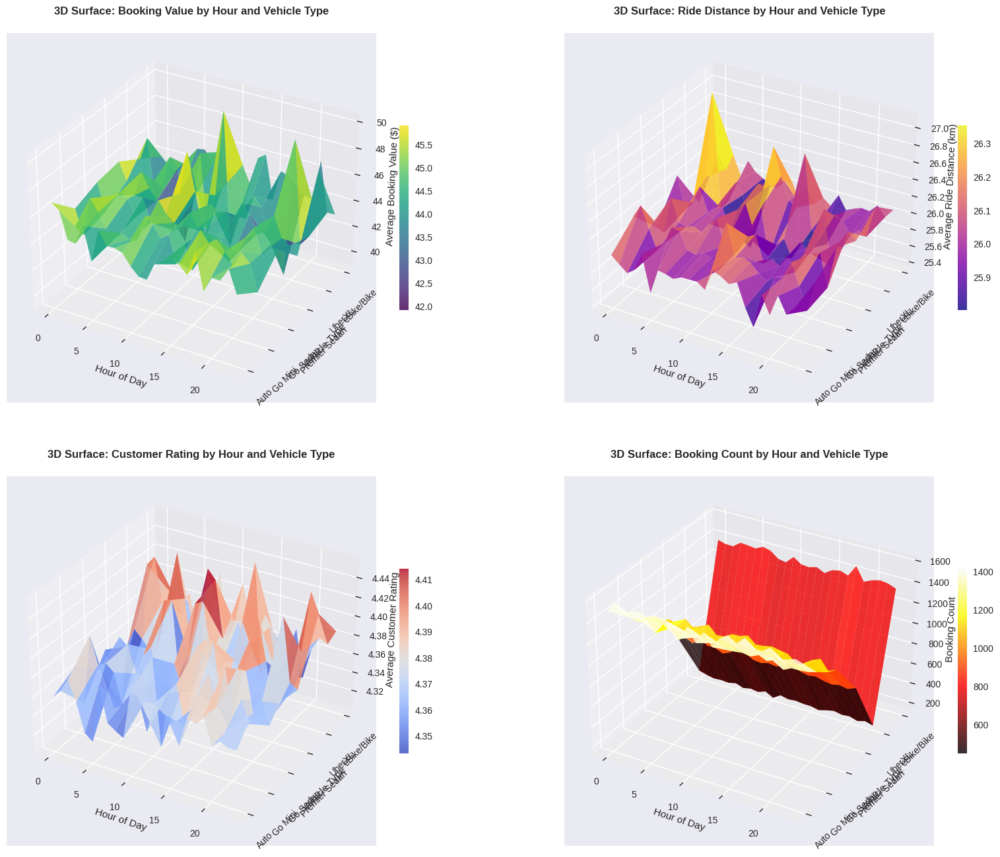

In [ ]:
# 3D Surface Plot for Multivariate Relationship Analysis
print("=== 3D SURFACE PLOT FOR MULTIVARIATE RELATIONSHIPS ===")

def create_3d_surface_plots():
    # Prepare data for 3D surface plots
    surface_data = uber_df.groupby(['Hour', 'Vehicle Type']).agg({
        'Booking Value': 'mean',
        'Ride Distance': 'mean',
        'Customer Rating': 'mean',
        'Booking ID': 'count'
    }).reset_index()

    # Create pivot tables for surface plots
    value_pivot = surface_data.pivot(index='Hour', columns='Vehicle Type', values='Booking Value').fillna(0)
    distance_pivot = surface_data.pivot(index='Hour', columns='Vehicle Type', values='Ride Distance').fillna(0)
    rating_pivot = surface_data.pivot(index='Hour', columns='Vehicle Type', values='Customer Rating').fillna(0)
    count_pivot = surface_data.pivot(index='Hour', columns='Vehicle Type', values='Booking ID').fillna(0)

    # Create 3D surface plots
    fig = plt.figure(figsize=(20, 16))

    # Plot 1: Booking Value surface
    ax1 = fig.add_subplot(221, projection='3d')
    X1, Y1 = np.meshgrid(value_pivot.index, range(len(value_pivot.columns)))
    Z1 = value_pivot.values.T

    surf1 = ax1.plot_surface(X1, Y1, Z1, cmap='viridis', alpha=0.8,
                           linewidth=0, antialiased=True)
    ax1.set_xlabel('Hour of Day')
    ax1.set_ylabel('Vehicle Type')
    ax1.set_zlabel('Average Booking Value ($)')
    ax1.set_title('3D Surface: Booking Value by Hour and Vehicle Type',
                 fontweight='bold', pad=20)
    ax1.set_yticks(range(len(value_pivot.columns)))
    ax1.set_yticklabels(value_pivot.columns, rotation=45)
    fig.colorbar(surf1, ax=ax1, shrink=0.5, aspect=20)

    # Plot 2: Ride Distance surface
    ax2 = fig.add_subplot(222, projection='3d')
    X2, Y2 = np.meshgrid(distance_pivot.index, range(len(distance_pivot.columns)))
    Z2 = distance_pivot.values.T

    surf2 = ax2.plot_surface(X2, Y2, Z2, cmap='plasma', alpha=0.8,
                           linewidth=0, antialiased=True)
    ax2.set_xlabel('Hour of Day')
    ax2.set_ylabel('Vehicle Type')
    ax2.set_zlabel('Average Ride Distance (km)')
    ax2.set_title('3D Surface: Ride Distance by Hour and Vehicle Type',
                 fontweight='bold', pad=20)
    ax2.set_yticks(range(len(distance_pivot.columns)))
    ax2.set_yticklabels(distance_pivot.columns, rotation=45)
    fig.colorbar(surf2, ax=ax2, shrink=0.5, aspect=20)

    # Plot 3: Customer Rating surface
    ax3 = fig.add_subplot(223, projection='3d')
    X3, Y3 = np.meshgrid(rating_pivot.index, range(len(rating_pivot.columns)))
    Z3 = rating_pivot.values.T

    surf3 = ax3.plot_surface(X3, Y3, Z3, cmap='coolwarm', alpha=0.8,
                           linewidth=0, antialiased=True)
    ax3.set_xlabel('Hour of Day')
    ax3.set_ylabel('Vehicle Type')
    ax3.set_zlabel('Average Customer Rating')
    ax3.set_title('3D Surface: Customer Rating by Hour and Vehicle Type',
                 fontweight='bold', pad=20)
    ax3.set_yticks(range(len(rating_pivot.columns)))
    ax3.set_yticklabels(rating_pivot.columns, rotation=45)
    fig.colorbar(surf3, ax=ax3, shrink=0.5, aspect=20)

    # Plot 4: Booking Count surface
    ax4 = fig.add_subplot(224, projection='3d')
    X4, Y4 = np.meshgrid(count_pivot.index, range(len(count_pivot.columns)))
    Z4 = count_pivot.values.T

    surf4 = ax4.plot_surface(X4, Y4, Z4, cmap='hot', alpha=0.8,
                           linewidth=0, antialiased=True)
    ax4.set_xlabel('Hour of Day')
    ax4.set_ylabel('Vehicle Type')
    ax4.set_zlabel('Booking Count')
    ax4.set_title('3D Surface: Booking Count by Hour and Vehicle Type',
                 fontweight='bold', pad=20)
    ax4.set_yticks(range(len(count_pivot.columns)))
    ax4.set_yticklabels(count_pivot.columns, rotation=45)
    fig.colorbar(surf4, ax=ax4, shrink=0.5, aspect=20)

    plt.tight_layout()
    plt.show()

    # Interactive 3D surface with Plotly
    fig = go.Figure()

    # Add surface for booking value
    fig.add_trace(go.Surface(
        x=value_pivot.index,
        y=list(value_pivot.columns),
        z=value_pivot.values.T,
        colorscale='Viridis',
        name="Booking Value",
        showscale=True
    ))

    fig.update_layout(
        title='Interactive 3D Surface: Multivariate Relationships',
        scene=dict(
            xaxis_title='Hour of Day',
            yaxis_title='Vehicle Type',
            zaxis_title='Average Booking Value ($)'
        ),
        width=800,
        height=600
    )

    fig.show()

create_3d_surface_plots()

=== INTERACTIVE NETWORK GRAPH WITH COMMUNITY DETECTION ===


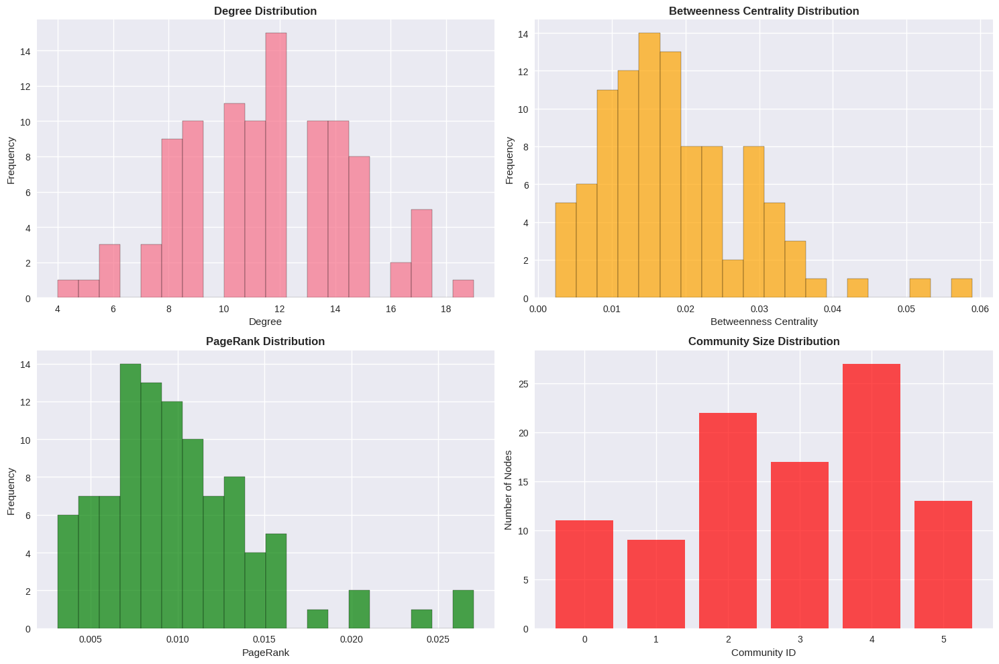

In [ ]:
#  Interactive Network Graph with Community Detection
print("=== INTERACTIVE NETWORK GRAPH WITH COMMUNITY DETECTION ===")

def create_interactive_network():
    # Create location network based on ride flows
    location_flows = uber_df.groupby(['Pickup Location', 'Drop Location']).size().reset_index(name='flow')

    # Filter for significant flows (top 5%)
    flow_threshold = location_flows['flow'].quantile(0.95)
    significant_flows = location_flows[location_flows['flow'] >= flow_threshold]

    # Create network graph
    G = nx.DiGraph()

    # Add nodes and edges
    for _, flow in significant_flows.iterrows():
        G.add_edge(flow['Pickup Location'], flow['Drop Location'], weight=flow['flow'])

    # Calculate node metrics
    degree_centrality = nx.degree_centrality(G)
    betweenness_centrality = nx.betweenness_centrality(G)
    pagerank = nx.pagerank(G)

    # Community detection using Louvain method
    try:
        import community as community_louvain
        partition = community_louvain.best_partition(G.to_undirected())
    except:
        # Fallback to simple community detection
        partition = {node: hash(node) % 5 for node in G.nodes()}

    # Create interactive network with Plotly
    pos = nx.spring_layout(G, k=1, iterations=50)

    # Extract node positions
    node_x = [pos[node][0] for node in G.nodes()]
    node_y = [pos[node][1] for node in G.nodes()]

    # Node sizes based on degree centrality
    node_size = [degree_centrality[node] * 5000 + 10 for node in G.nodes()]

    # Node colors based on community
    community_colors = {0: 'red', 1: 'blue', 2: 'green', 3: 'orange', 4: 'purple'}
    node_color = [community_colors[partition[node] % 5] for node in G.nodes()]

    # Create edge traces
    edge_x = []
    edge_y = []

    for edge in G.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.extend([x0, x1, None])
        edge_y.extend([y0, y1, None])

    edge_trace = go.Scatter(
        x=edge_x, y=edge_y,
        line=dict(width=0.5, color='#888'),
        hoverinfo='none',
        mode='lines')

    # Create node trace
    node_trace = go.Scatter(
        x=node_x, y=node_y,
        mode='markers+text',
        hoverinfo='text',
        marker=dict(
            size=node_size,
            color=node_color,
            line=dict(width=2, color='darkblue')
        ),
        text=[f"Location: {node}<br>Degree: {degree_centrality[node]:.3f}<br>Community: {partition[node]}"
              for node in G.nodes()],
        textposition="top center")

    # Create the figure
    fig = go.Figure(data=[edge_trace, node_trace],
                   layout=go.Layout(
                       title='Interactive Network Graph: Location Connectivity',
                       titlefont_size=16,
                       showlegend=False,
                       hovermode='closest',
                       margin=dict(b=20,l=5,r=5,t=40),
                       annotations=[ dict(
                           text="Node size: Degree Centrality<br>Color: Community",
                           showarrow=False,
                           xref="paper", yref="paper",
                           x=0.005, y=-0.002 ) ],
                       xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                       yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                   )

    fig.show()

    # Additional network metrics visualization
    fig_metrics, axes = plt.subplots(2, 2, figsize=(15, 10))

    # Degree distribution
    degrees = [G.degree(node) for node in G.nodes()]
    axes[0,0].hist(degrees, bins=20, alpha=0.7, edgecolor='black')
    axes[0,0].set_title('Degree Distribution', fontweight='bold')
    axes[0,0].set_xlabel('Degree')
    axes[0,0].set_ylabel('Frequency')

    # Betweenness centrality distribution
    betweenness_values = list(betweenness_centrality.values())
    axes[0,1].hist(betweenness_values, bins=20, alpha=0.7, edgecolor='black', color='orange')
    axes[0,1].set_title('Betweenness Centrality Distribution', fontweight='bold')
    axes[0,1].set_xlabel('Betweenness Centrality')
    axes[0,1].set_ylabel('Frequency')

    # PageRank distribution
    pagerank_values = list(pagerank.values())
    axes[1,0].hist(pagerank_values, bins=20, alpha=0.7, edgecolor='black', color='green')
    axes[1,0].set_title('PageRank Distribution', fontweight='bold')
    axes[1,0].set_xlabel('PageRank')
    axes[1,0].set_ylabel('Frequency')

    # Community size distribution
    community_sizes = {}
    for node, comm in partition.items():
        community_sizes[comm] = community_sizes.get(comm, 0) + 1

    axes[1,1].bar(community_sizes.keys(), community_sizes.values(), alpha=0.7, color='red')
    axes[1,1].set_title('Community Size Distribution', fontweight='bold')
    axes[1,1].set_xlabel('Community ID')
    axes[1,1].set_ylabel('Number of Nodes')

    plt.tight_layout()
    plt.show()

create_interactive_network()

In [ ]:
#  Business Insights and Recommendations
print("=== KEY BUSINESS INSIGHTS ===")

# Calculate key metrics
total_revenue = uber_df[uber_df['Booking Status'] == 'Completed']['Booking Value'].sum()
cancellation_rate = (len(uber_df[uber_df['Booking Status'].str.contains('Cancelled')]) / len(uber_df)) * 100
avg_rating = uber_df['Customer Rating'].mean()
success_rate = (len(uber_df[uber_df['Booking Status'] == 'Completed']) / len(uber_df)) * 100

print(f"Total Revenue (Completed Rides): ${total_revenue:,.2f}")
print(f"Overall Success Rate: {success_rate:.1f}%")
print(f"Cancellation Rate: {cancellation_rate:.1f}%")
print(f"Average Customer Rating: {avg_rating:.2f}/5.0")

# Peak hours analysis
peak_hours = uber_df['Hour'].value_counts().head(3)
print(f"\nPeak Booking Hours: {list(peak_hours.index)}")

# Most profitable vehicle type
revenue_per_vehicle = uber_df[uber_df['Booking Status'] == 'Completed'].groupby('Vehicle Type')['Booking Value'].sum()
most_profitable = revenue_per_vehicle.idxmax()
print(f"Most Profitable Vehicle Type: {most_profitable}")

# Cancellation hotspots
cancel_by_hour = uber_df[uber_df['Booking Status'].str.contains('Cancelled')]['Hour'].value_counts().head(3)
print(f"Highest Cancellation Hours: {list(cancel_by_hour.index)}")

print("\n=== RECOMMENDATIONS ===")
print("1. Focus on reducing cancellations during peak hours through surge pricing optimization")
print("2. Invest in the most profitable vehicle types while maintaining fleet diversity")
print("3. Implement driver incentives during high-cancellation periods")
print("4. Enhance customer communication to reduce cancellation rates")
print("5. Optimize vehicle allocation based on time-based demand patterns")

=== KEY BUSINESS INSIGHTS ===
Total Revenue (Completed Rides): $6,047,562.39
Overall Success Rate: 91.1%
Cancellation Rate: 8.0%
Average Customer Rating: 4.37/5.0

Peak Booking Hours: [7, 4, 15]
Most Profitable Vehicle Type: Auto
Highest Cancellation Hours: [4, 8, 16]

=== RECOMMENDATIONS ===
1. Focus on reducing cancellations during peak hours through surge pricing optimization
2. Invest in the most profitable vehicle types while maintaining fleet diversity
3. Implement driver incentives during high-cancellation periods
4. Enhance customer communication to reduce cancellation rates
5. Optimize vehicle allocation based on time-based demand patterns
